In [3]:
#import matplotlib
#matplotlib.u<se("TkAgg")

import sys
path = r"/Users/constantinslioussarenko/PythonGitRepositories/MyoMap"
path = r"/home/cslioussarenko/PythonRepositories"
sys.path.append(path+"/epgpy")
sys.path.append(path+"/machines")
sys.path.append(path+"/mutools")
sys.path.append(path+"/dicomstack")
sys.path.append(path+"/mrf-sim")


from mrfsim import T1MRF
from image_series import *
from dictoptimizers import SimpleDictSearch
from utils_mrf import *
import seaborn as sns
from functools import reduce


import matplotlib.pyplot as plt
%matplotlib inline

def fill_dictfile_value_mapping(dictfile_list,FF_list = np.arange(0,1.05,0.05)):
    dictfile_value_mapping={}
    for dictfile in dictfile_list:
        keys,values=read_mrf_dict(dictfile,FF_list,aggregate_components=True)
        dictfile_value_mapping[dictfile]=values
    keys = np.array(keys)
    
    return dictfile_value_mapping,keys

def compare_dict_covariance(dictfile_value_mapping,keys,fixed_parameters_list,fixed_values=None):
    global param_index_mapping
    filtered_index_list=[]
    non_fixed_parameters_list=list(set(list(param_index_mapping.keys()))-set(list(fixed_parameters_list)))
    fixed_param_values_dict={}
    
    for j,p in enumerate(fixed_parameters_list):
        index_fixed=param_index_mapping[p]
        if fixed_values is None:
            p_fixed = np.random.choice(np.unique(keys[:,index_fixed]))
        else:
            p_fixed=fixed_values[j]
        fixed_param_values_dict[p]=p_fixed
        filtered_index_list.append((keys[:,index_fixed]==p_fixed))
    
    filtered_index_list=reduce(lambda x, y: x*y, filtered_index_list)
    index_filter = np.argwhere(filtered_index_list).flatten()
    keys_filtered = keys[index_filter]

    non_fixed_index_list=[]
    for p in non_fixed_parameters_list:
        non_fixed_index_list.append(param_index_mapping[p])   
    axis_values= np.round(keys_filtered[:,non_fixed_index_list],2)
    

    
    dictfile_corr_mapping={}
    
    for dict_file in dictfile_value_mapping.keys():
        signal = dictfile_value_mapping[dict_file][index_filter,:]
        #mean=np.expand_dims(np.mean(signal,axis=-1),axis=-1)
        #signal-=mean
        #print(mean)
        cov_signal = np.abs(signal@signal.conj().T)
        inverse_std_signal = np.diag(np.sqrt(1/np.diag(cov_signal)))
        corr_signal = inverse_std_signal@cov_signal@inverse_std_signal
        dictfile_corr_mapping[dict_file]=corr_signal
        
        plt.figure(figsize=(15,15))
        sns.heatmap(corr_signal,xticklabels=axis_values, yticklabels=axis_values)
        plt.title("{} :Fingerprints Correlation Map For {}".format(dict_file,fixed_param_values_dict))
        
    return dictfile_corr_mapping,axis_values

def compare_random_signals_correlations(dictfile_corr_mapping,axis_values,num_sig=1,transpose=False):
    corr_shape=list(dictfile_corr_mapping.values())[0].shape[0]
    
    if transpose:
        shape_0=len(np.unique(axis_values[:,0]))
        shape_1=len(np.unique(axis_values[:,1]))
        axis_values_copy=copy(axis_values)
        axis_values[:,0]=axis_values_copy[:,1]
        axis_values[:,1]=axis_values_copy[:,0]
        del axis_values_copy
    for i in range(num_sig):
        num_signal=np.random.choice(corr_shape)
        plt.figure(figsize=(15,10))
        for dictfile in dictfile_corr_mapping.keys():
            corr_signal=dictfile_corr_mapping[dictfile]
            if transpose:
                corr_signal=corr_signal.reshape(shape_0,shape_1,shape_0,shape_1)
                corr_signal=np.moveaxis(corr_signal,-1,-2)
                corr_signal=np.moveaxis(corr_signal,0,1)
                
                corr_signal=corr_signal.reshape(corr_shape,corr_shape)
            plt.plot(corr_signal[num_signal,:],label=dictfile)
        plt.axvline(x=num_signal,c="r")
        plt.title("Optim params : {}".format(axis_values[num_signal]))
        plt.legend()
    
def calculate_variance(index_param1,index_param2,index_param3,keys,values):
    param1_all=np.unique(keys[:,index_param1])
    param2_all=np.unique(keys[:,index_param2])
    param3_all=np.unique(keys[:,index_param3])

    variances=[]
    for p1 in tqdm(param1_all):
        for p2 in param2_all :
            for p3 in param3_all:
                index_keys = np.argwhere((keys[:,index_param1]==p1)&(keys[:,index_param2]==p2)&(keys[:,index_param3]==p3)).flatten()
                #print(index_keys)
                #print(keys[index_keys])
                if len(index_keys)==0:
                    continue
                    
                signal_filtered =values[index_keys,:]
                
                curr_std = np.std(signal_filtered,axis=0)
                variances.append(curr_std)

    variances=np.array(variances)
    mean_variance=np.mean(np.array(variances),axis=0)
    return mean_variance

Could not import SPIJN


In [4]:
param_index_mapping={
    "wT1":0,
    "B1":2,
    "Df":3,
    "FF":4
    
}


# Constant TE

In [147]:
#dictfile_list=["../mrf175_SimReco2_light.dict","../mrf175_SimReco2_light_constantTE_first.dict","../mrf175_SimReco2_light_constantTE_mid.dict","../mrf175_SimReco2_light_constantTE_last.dict"] 
dictfile_list=["../mrf60_SeqFF_light.dict","../mrf60_SeqFF_FA20_light.dict","../mrf60_SeqFF_FFonly_light.dict","../mrf60_SeqFF_FFDf_light.dict","../mrf60_SeqFF_optim_light.dict","../mrf60_SeqFF_Cohen_light.dict"]
dictfile_list=["../mrf60_SeqFF_light.dict","../mrf60_SeqFF_FFDf_light.dict","../mrf60_SeqFF_Cohen_light.dict","../mrf60_SeqFF_CohenWeighted_light.dict","../mrf78_SeqFF_CohenWeighted_light.dict"]
dictfile_list=["../mrf60_SeqFF_light.dict","../mrf60_SeqFF_FFDf_light.dict","../mrf60_SeqFF_Cohen_light.dict","../mrf60_SeqFF_CohenWeighted_light.dict","../mrf78_SeqFF_CohenWeighted_light.dict"]
#dictfile_list=["../mrf175_SimReco2_light.dict","../mrf175_SimReco2_light_adjusted_M0_optimized.dict","../mrf175_SimReco2_light_adjusted_M0_optimized_TE_test.dict","../mrf175_SimReco2_light_adjusted_NoReco.dict","../mrf175_SimReco2_light_adjusted_M0_T1_filter_DFFFTR.dict","../mrf175_SimReco2_light_adjusted_M0_T1_filter_DFFFTR_2.dict"]
dictfile_list=["../mrf175_SimReco2_light.dict","../mrf175_SimReco2_light_adjusted_NoReco.dict","../mrf175_SimReco2_light_adjusted_M0_T1_filter_DFFFTR.dict","../mrf175_SimReco2_light_adjusted_M0_T1_filter_DFFFTR_2.dict"]
dictfile_list=["../mrf175_SimReco2.dict",
               "../mrf_dictconf_SimReco2_adjusted_760_reco3_w8_simmean.dict",
               "../mrf_dictconf_SimReco2_adjusted_optimized_M0_T1_local_optim_correl_crlb_filter_sp760_optimized_DE_Simu_FF_reco3_w8_simmean.dict",
               #"../mrf_dictconf_SimReco2_light_adjusted_optimized_M0_T1_local_optim_correl_crlb_filter_sp760_optimized_DE_Simu_FF_random_v4_reco3.9_w8_simmean.dict",
               
               "../mrf_dictconf_SimReco2_adjusted_optimized_M0_T1_local_optim_correl_crlb_filter_sp760_optimized_DE_Simu_FF_random_v5_reco4_w8_simmean.dict"]
 
dictfile_value_mapping,keys=fill_dictfile_value_mapping(dictfile_list)

## FF and Df

In [185]:
fixed_parameters_list=["wT1","B1"]
fixed_values=[1250,0.7]

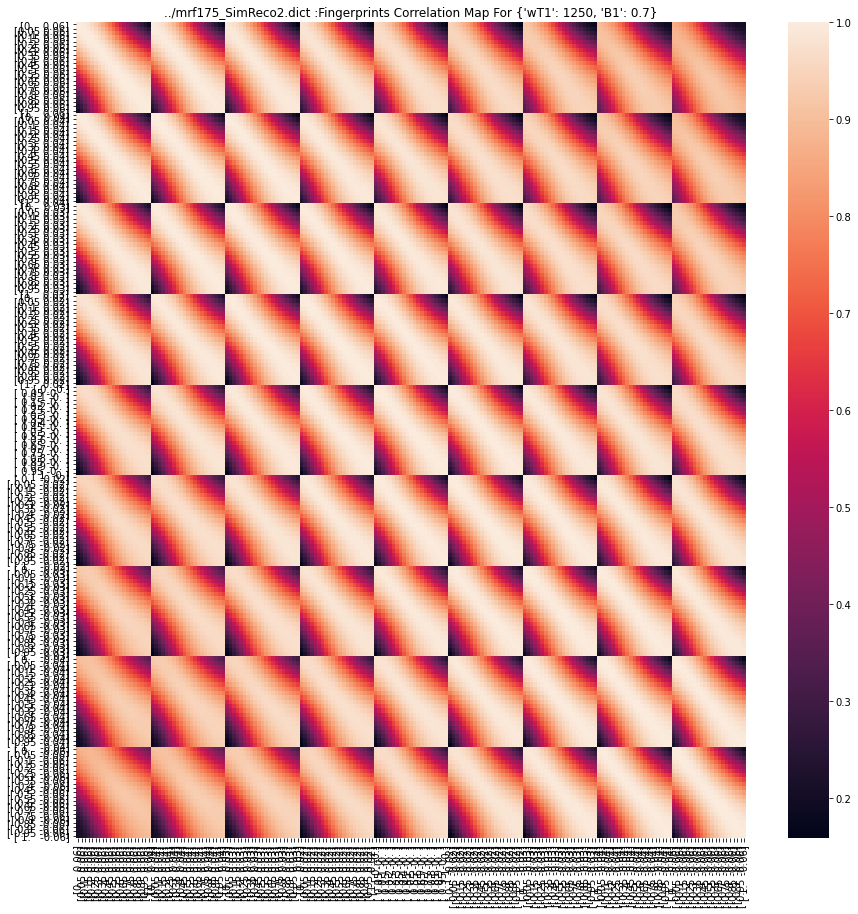

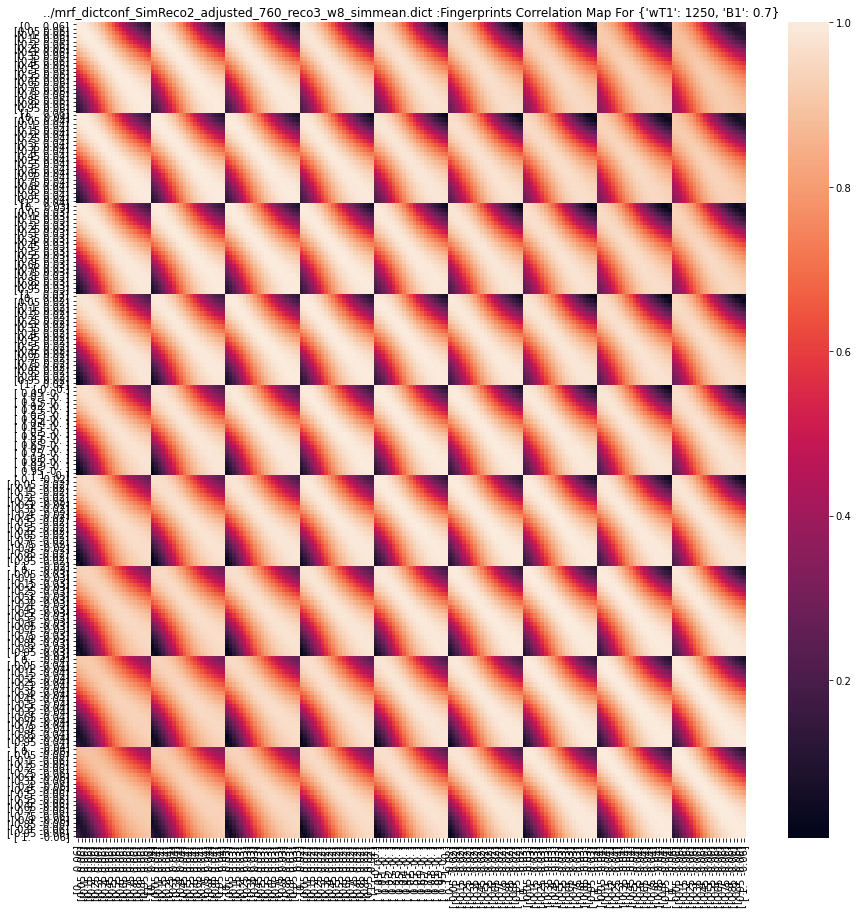

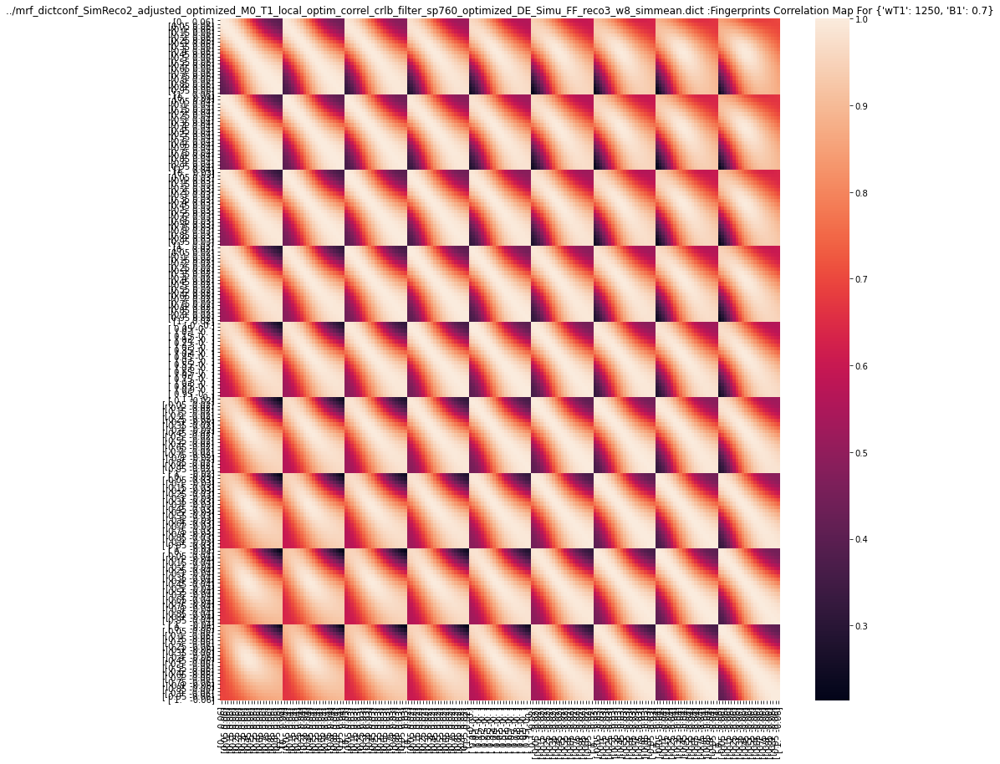

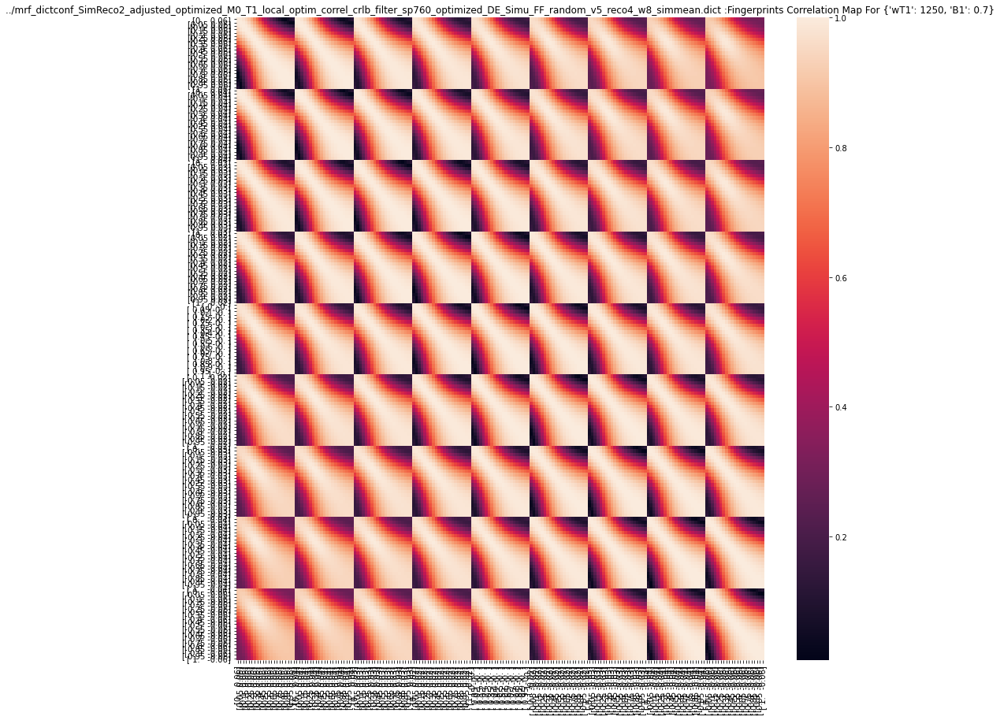

In [186]:
%matplotlib inline
dictfile_corr_mapping,axis_values=compare_dict_covariance(dictfile_value_mapping,keys,fixed_parameters_list,fixed_values=fixed_values)

<IPython.core.display.Javascript object>


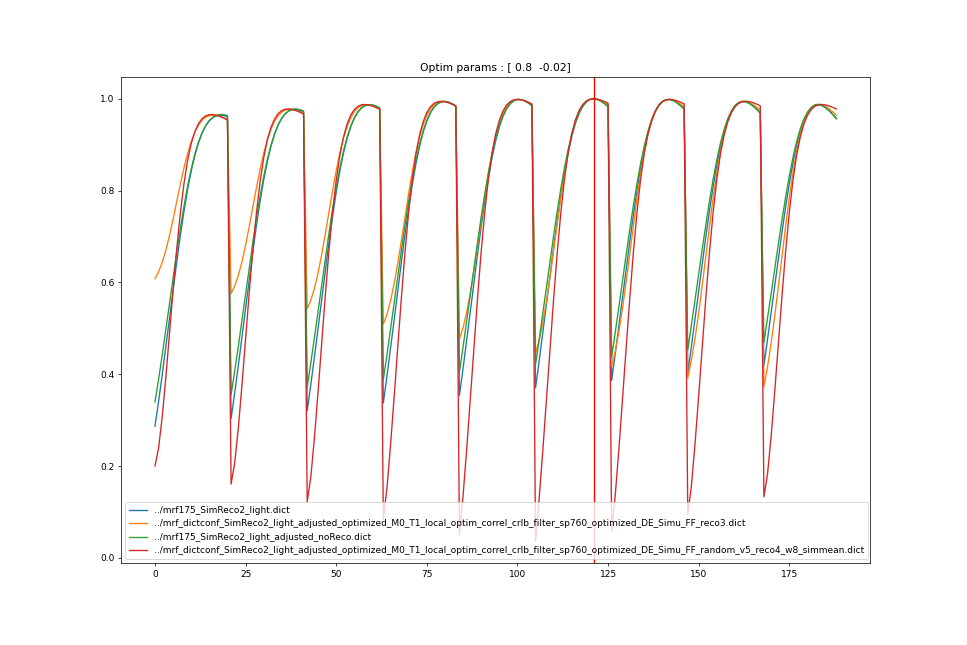

<IPython.core.display.Javascript object>


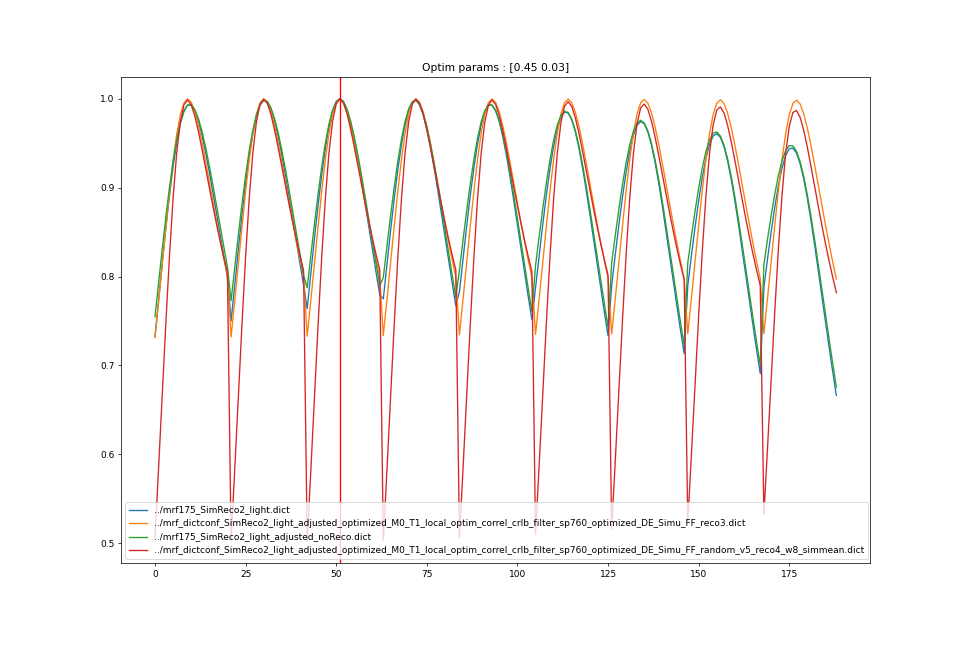

<IPython.core.display.Javascript object>


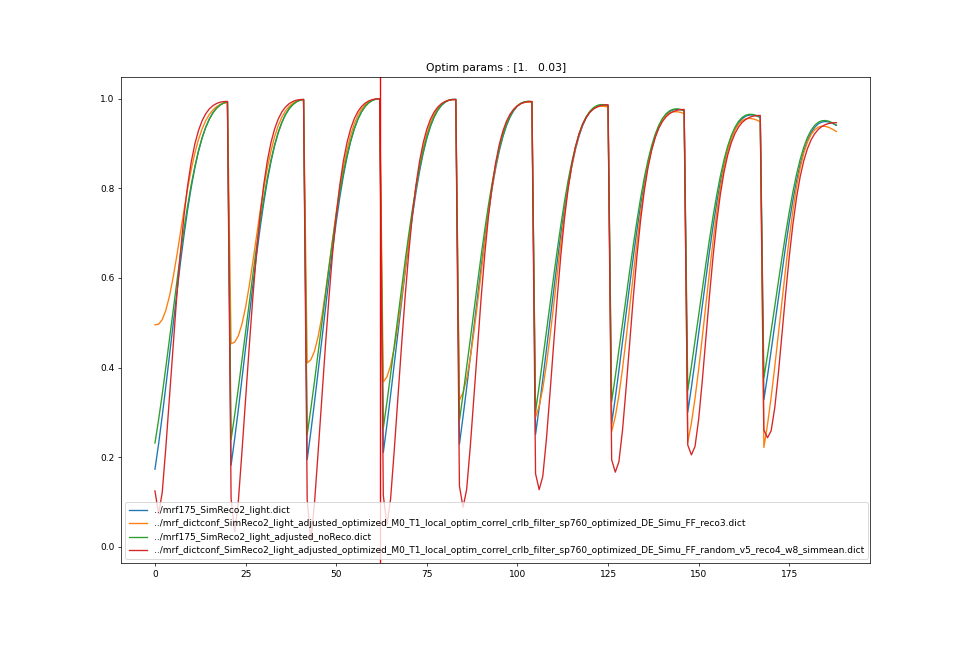

<IPython.core.display.Javascript object>


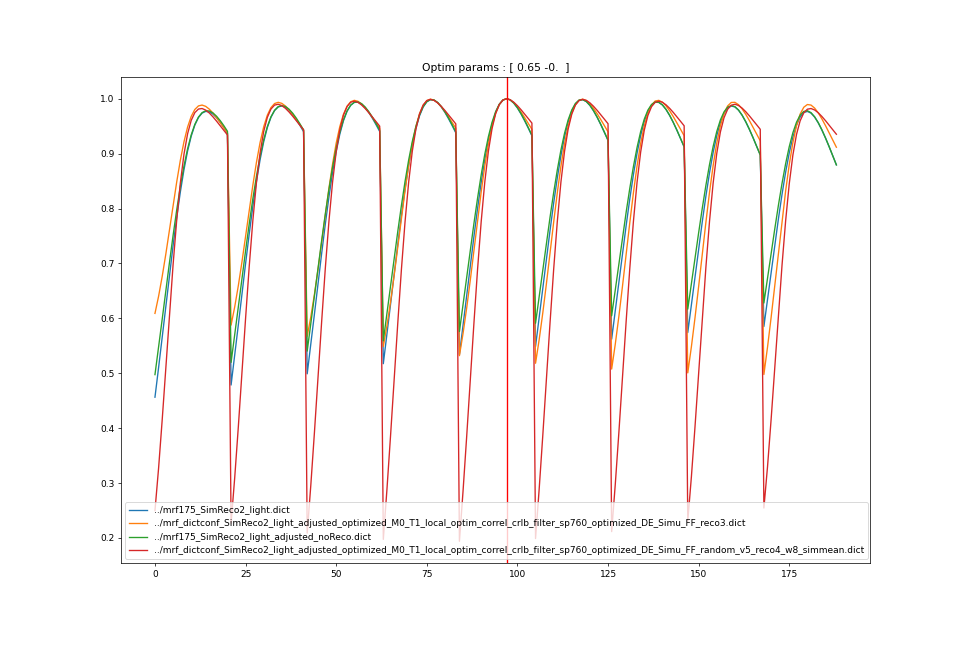

<IPython.core.display.Javascript object>


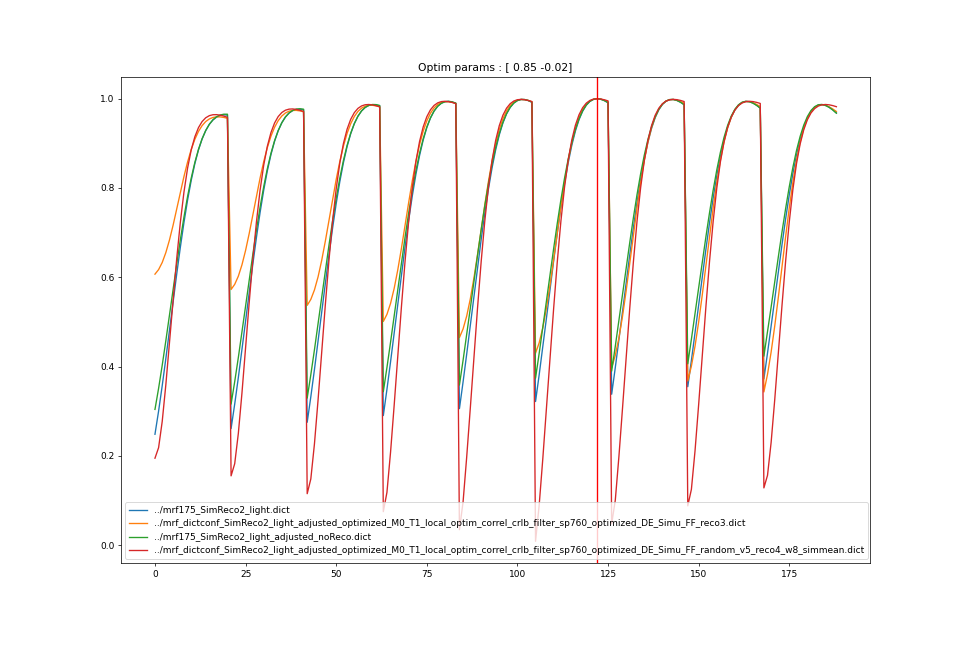

In [138]:
compare_random_signals_correlations(dictfile_corr_mapping,axis_values,num_sig=5,transpose=False)

<IPython.core.display.Javascript object>


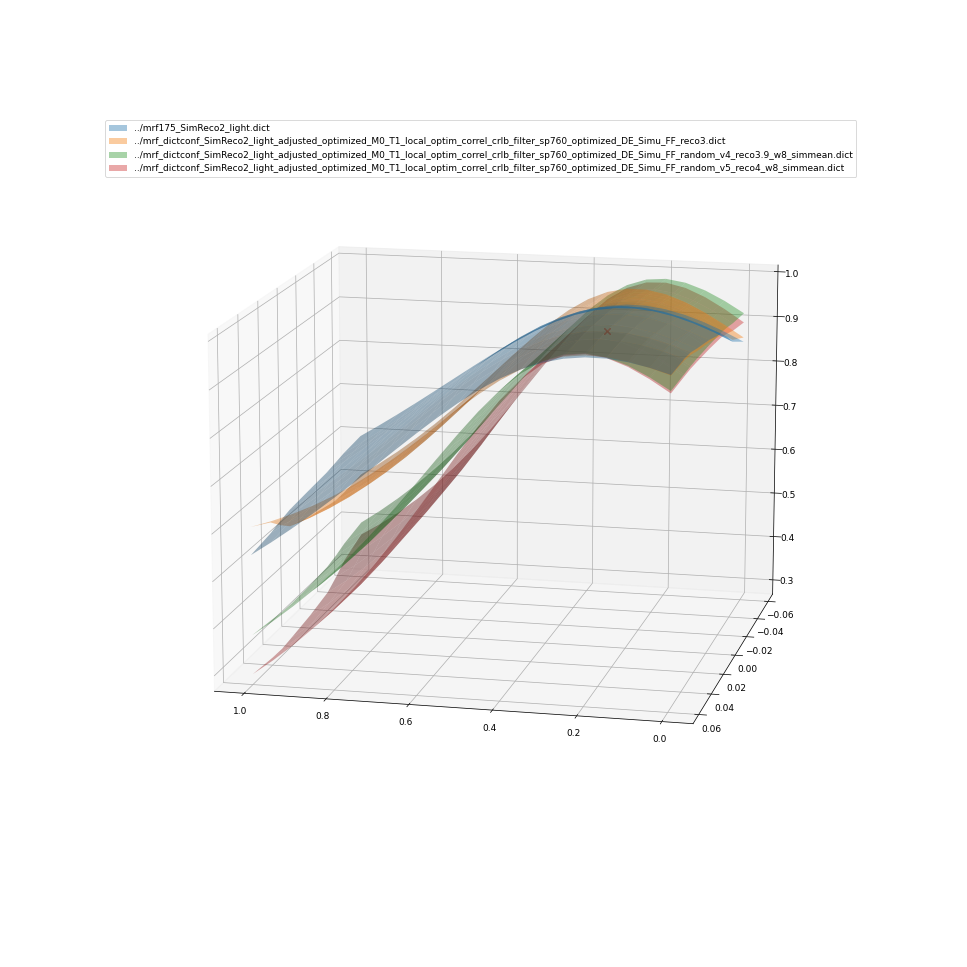

In [69]:
%matplotlib notebook
corr_shape=list(dictfile_corr_mapping.values())[0].shape[0]

num_signal=np.random.choice(corr_shape)
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
for dictfile in dictfile_value_mapping.keys():
    corr_signal=dictfile_corr_mapping[dictfile]

    
    curr_corr=corr_signal[num_signal,:]

    shape_0=len(np.unique(axis_values[:,0]))
    shape_1=len(np.unique(axis_values[:,1]))

    X,Y=np.meshgrid(np.unique(axis_values[:,0]),np.unique(axis_values[:,1]))
    Z=curr_corr.reshape(shape_1,shape_0)
    
    surf=ax.plot_surface(X, Y, Z,alpha=0.4,label=dictfile)
    max_coord=np.unravel_index(np.argmax(Z),(shape_1,shape_0))
    ax.plot(X[max_coord[0],max_coord[1]],Y[max_coord[0],max_coord[1]],1,marker="x",c="red")
    surf._edgecolors2d = surf._edgecolor3d
    surf._facecolors2d = surf._facecolor3d

ax.legend()

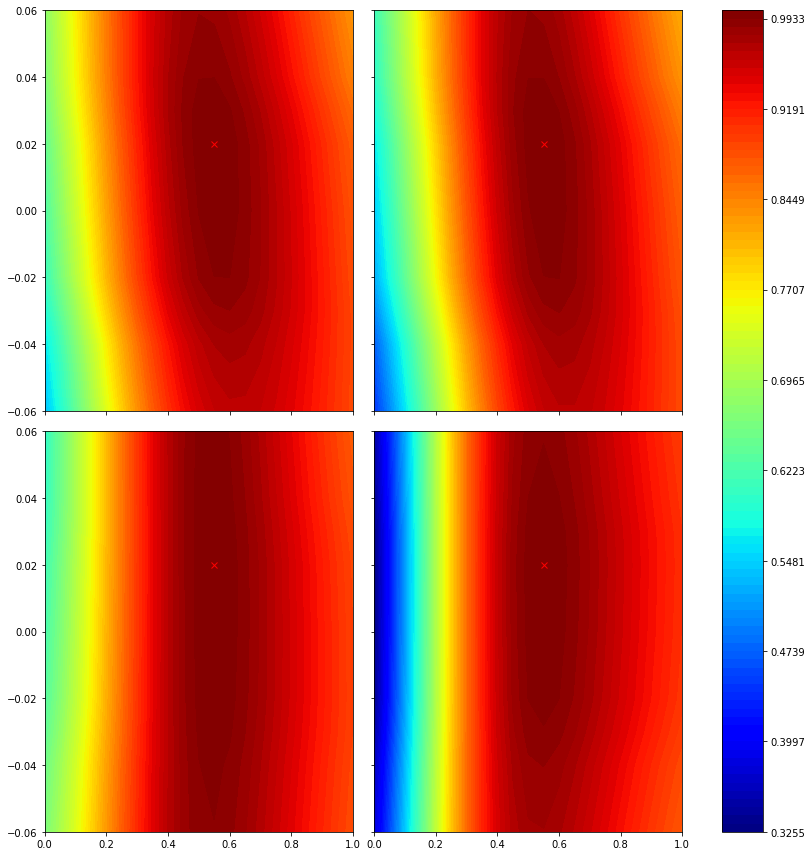

In [192]:
fig, axn = plt.subplots(2, 2, sharex=True, sharey=True,figsize=(12,12))
#cbar_ax = fig.add_axes([.91, .3, .03, .4])
corr_shape=list(dictfile_corr_mapping.values())[0].shape[0]
num_signal=np.random.choice(corr_shape)

N=100
max_corr=0
min_corr=np.inf

for dictfile in dictfile_value_mapping.keys():
    corr_signal=dictfile_corr_mapping[dictfile]
    corr_shape=corr_signal.shape[0]
    curr_corr=corr_signal[num_signal,:]
    max_corr=np.maximum(np.max(curr_corr),max_corr)
    min_corr=np.minimum(np.min(curr_corr),min_corr)
    

levels=np.arange(min_corr,max_corr+(max_corr-min_corr)/N,(max_corr-min_corr)/N)

for i, ax in enumerate(axn.flat):
    dictfile=list(dictfile_value_mapping.keys())[i]
    corr_signal=dictfile_corr_mapping[dictfile]

    corr_shape=corr_signal.shape[0]
    
    curr_corr=corr_signal[num_signal,:]
    

    shape_0=len(np.unique(axis_values[:,0]))
    shape_1=len(np.unique(axis_values[:,1]))
    X,Y=np.meshgrid(np.unique(axis_values[:,0]),np.unique(axis_values[:,1]))
    Z=curr_corr.reshape(shape_1,shape_0)
    
    #sns.heatmap(Z, ax=ax,
    #            cbar=i == 0,
    #            vmin=0, vmax=1,xticklabels=np.unique(axis_values[:,0]), yticklabels=np.unique(axis_values[:,1]),
    #            cbar_ax=None if i else cbar_ax)
    #
    #if i==0:
    #    cf=ax.contourf(X,Y,Z,100,cmap="viridis")
    #    levels=cf.levels
    #else:
    #    cf=ax.contourf(X,Y,Z,100,levels=levels,cmap="viridis")
        
    cf=ax.contourf(X,Y,Z,N,levels=levels,cmap="jet")
    
    max_coord=np.unravel_index(np.argmax(Z),(shape_1,shape_0))
    ax.plot(X[max_coord[0],max_coord[1]],Y[max_coord[0],max_coord[1]],marker="x",c="red")
    
    #ax.plot()
        
    
plt.tight_layout()
plt.colorbar(cf, ax=axn)
    
#fig.tight_layout(rect=[0, 0, .9, 1])

In [91]:
levels

array([0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ])

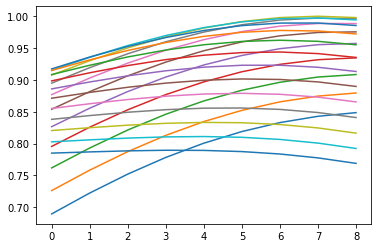

In [37]:
plt.plot(curr_corr.reshape(shape_1,shape_0))

In [ ]:
for i in range(num_sig):
    num_signal=np.random.choice(corr_shape)
    plt.figure(figsize=(15,10))
    for dictfile in dictfile_corr_mapping.keys():
        corr_signal=dictfile_corr_mapping[dictfile]
        if transpose:
            corr_signal=corr_signal.reshape(shape_0,shape_1,shape_0,shape_1)
            corr_signal=np.moveaxis(corr_signal,-1,-2)
            corr_signal=np.moveaxis(corr_signal,0,1)
            
            corr_signal=corr_signal.reshape(corr_shape,corr_shape)
        plt.plot(corr_signal[num_signal,:],label=dictfile)
    plt.axvline(x=num_signal,c="r")
    plt.title("Optim params : {}".format(axis_values[num_signal]))
    plt.legend()

In [19]:
axis_values

array([[ 0.  ,  0.06],
       [ 0.05,  0.06],
       [ 0.1 ,  0.06],
       [ 0.15,  0.06],
       [ 0.2 ,  0.06],
       [ 0.25,  0.06],
       [ 0.3 ,  0.06],
       [ 0.35,  0.06],
       [ 0.4 ,  0.06],
       [ 0.45,  0.06],
       [ 0.5 ,  0.06],
       [ 0.55,  0.06],
       [ 0.6 ,  0.06],
       [ 0.65,  0.06],
       [ 0.7 ,  0.06],
       [ 0.75,  0.06],
       [ 0.8 ,  0.06],
       [ 0.85,  0.06],
       [ 0.9 ,  0.06],
       [ 0.95,  0.06],
       [ 1.  ,  0.06],
       [ 0.  ,  0.04],
       [ 0.05,  0.04],
       [ 0.1 ,  0.04],
       [ 0.15,  0.04],
       [ 0.2 ,  0.04],
       [ 0.25,  0.04],
       [ 0.3 ,  0.04],
       [ 0.35,  0.04],
       [ 0.4 ,  0.04],
       [ 0.45,  0.04],
       [ 0.5 ,  0.04],
       [ 0.55,  0.04],
       [ 0.6 ,  0.04],
       [ 0.65,  0.04],
       [ 0.7 ,  0.04],
       [ 0.75,  0.04],
       [ 0.8 ,  0.04],
       [ 0.85,  0.04],
       [ 0.9 ,  0.04],
       [ 0.95,  0.04],
       [ 1.  ,  0.04],
       [ 0.  ,  0.03],
       [ 0.

In [23]:
shape_0

21

In [14]:
dictfile_corr_mapping

{'../mrf175_SimReco2_light.dict': array([[1.        , 0.99959885, 0.99845342, 0.99663555, 0.99119876,
         0.98363395, 0.97419865, 0.95055034, 0.92175778, 0.88918003,
         0.85406253, 0.81750502],
        [0.99959885, 1.        , 0.99962708, 0.99855508, 0.9945398 ,
         0.98831461, 0.98014665, 0.95883888, 0.9321491 , 0.90145165,
         0.86800433, 0.83292034],
        [0.99845342, 0.99962708, 1.        , 0.99964988, 0.99701484,
         0.99209525, 0.98516649, 0.96615688, 0.941542  , 0.91270812,
         0.880923  , 0.84731138],
        [0.99663555, 0.99855508, 0.99964988, 1.        , 0.99870769,
         0.99506253, 0.98934695, 0.97259582, 0.95002912, 0.92304217,
         0.89291059, 0.86076894],
        [0.99119876, 0.9945398 , 0.99701484, 0.99870769, 1.        ,
         0.99881907, 0.99545848, 0.98311364, 0.96456682, 0.94122414,
         0.9143715 , 0.88515875],
        [0.98363395, 0.98831461, 0.99209525, 0.99506253, 0.99881907,
         1.        , 0.99890702, 0.990

In [75]:
curr_wT1=1000
curr_df=0
curr_b1=1
curr_ff=0.1
np.where((keys == (curr_wT1, 300,curr_b1,curr_df,curr_ff)).all(axis=1))[0][0]

10481

In [76]:
random_idx

10017

/Users/constantinslioussarenko/opt/anaconda3/envs/MRF/lib/python3.8/site-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


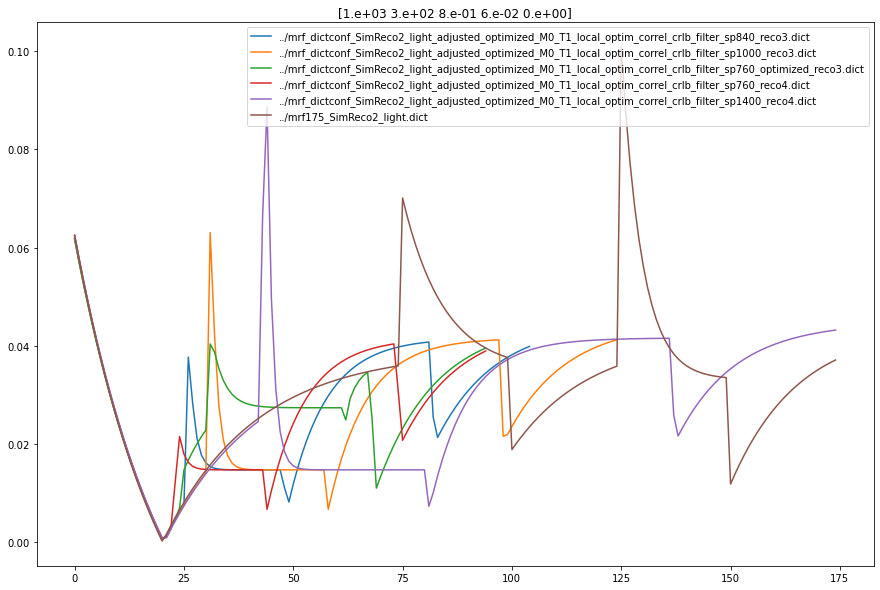

In [16]:
curr_wT1=1000
curr_df=0.06
curr_b1=0.8
curr_ff=0.
random_idx=np.where((keys == (curr_wT1, 300,curr_b1,curr_df,curr_ff)).all(axis=1))[0][0]

metric=np.abs

plt.figure(figsize=(15,10))
for k in dictfile_value_mapping.keys():    
    plt.plot(metric(dictfile_value_mapping[k][random_idx]),label=k)
#plt.plot(metric(dictfile_value_mapping["../mrf60_SeqFF_CohenWeighted_light.dict"][random_idx]))
plt.title(keys[random_idx])
plt.legend()

In [78]:
random_idx

10017

/home/cslioussarenko/anaconda3/lib/python3.8/site-packages/matplotlib/text.py:1223: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


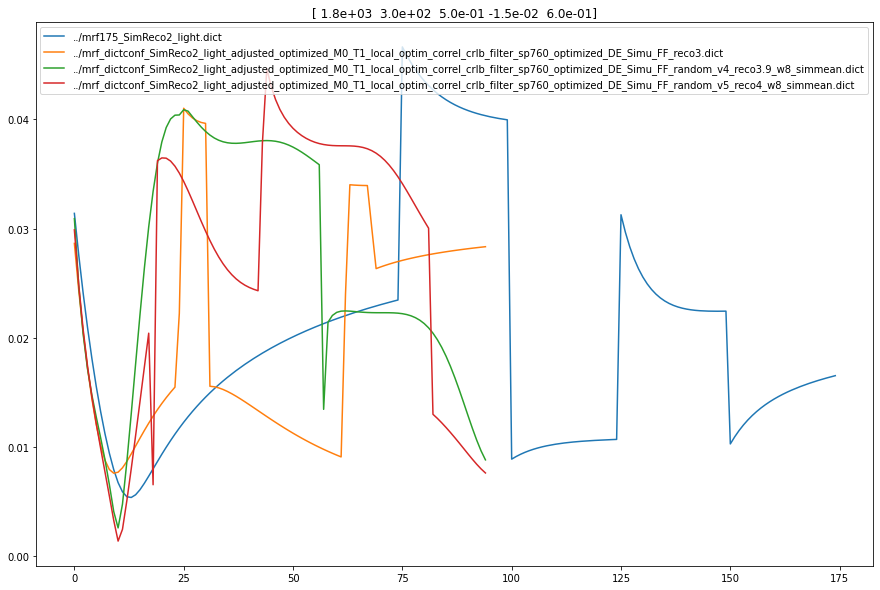

In [9]:

random_idx=np.random.choice(list(dictfile_value_mapping.values())[0].shape[0])
metric=np.abs

plt.figure(figsize=(15,10))
for k in dictfile_value_mapping.keys():    
    plt.plot(metric(dictfile_value_mapping[k][random_idx]),label=k)
#plt.plot(metric(dictfile_value_mapping["../mrf60_SeqFF_CohenWeighted_light.dict"][random_idx]))
plt.title(keys[random_idx])
plt.legend()

## T1

In [162]:
fixed_parameters_list=["Df","FF"]
fixed_values=[0,0.1]
#fixed_values=None
#fixed_values=[0.045,0.1,0.7]

In [163]:
#B1<0.6 / df 0 ; df >=0.045 / B1<=0.7 - starts to be less good

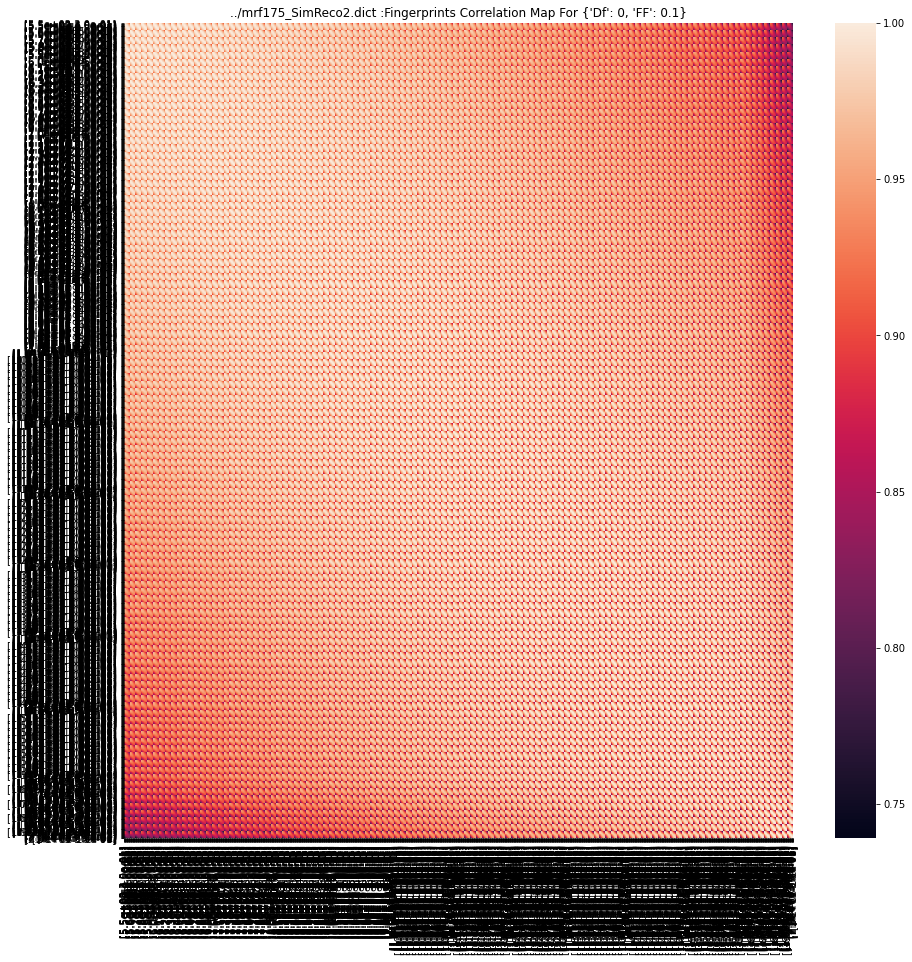

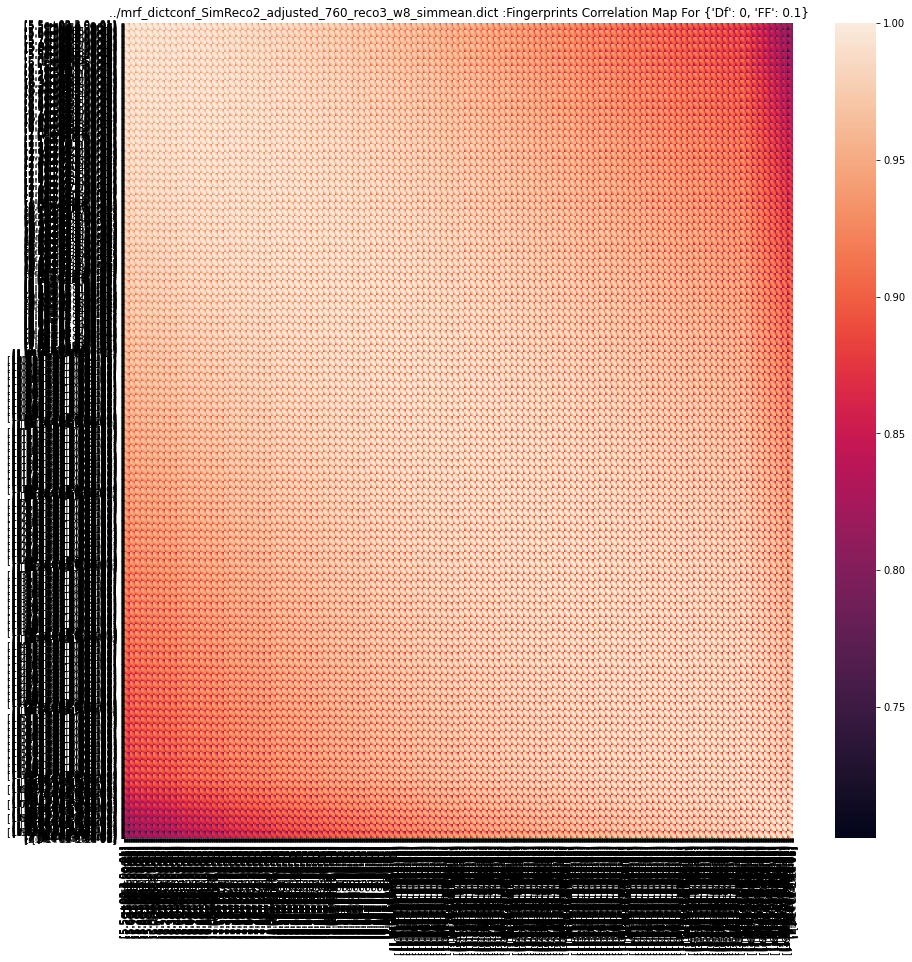

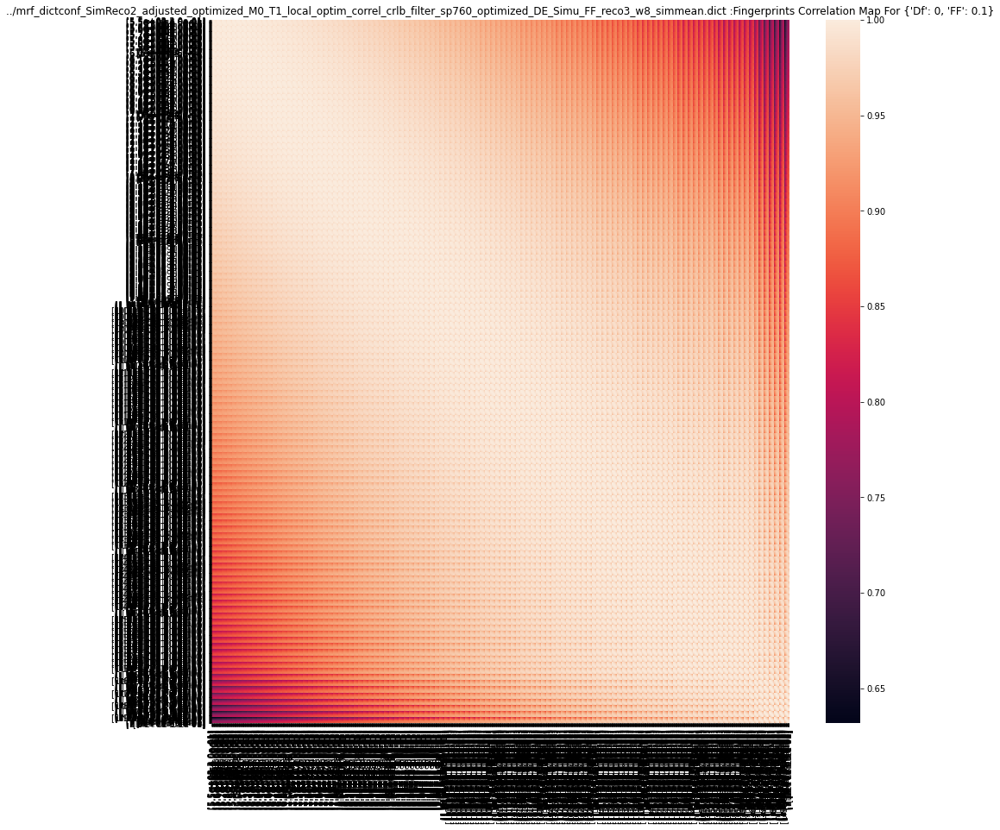

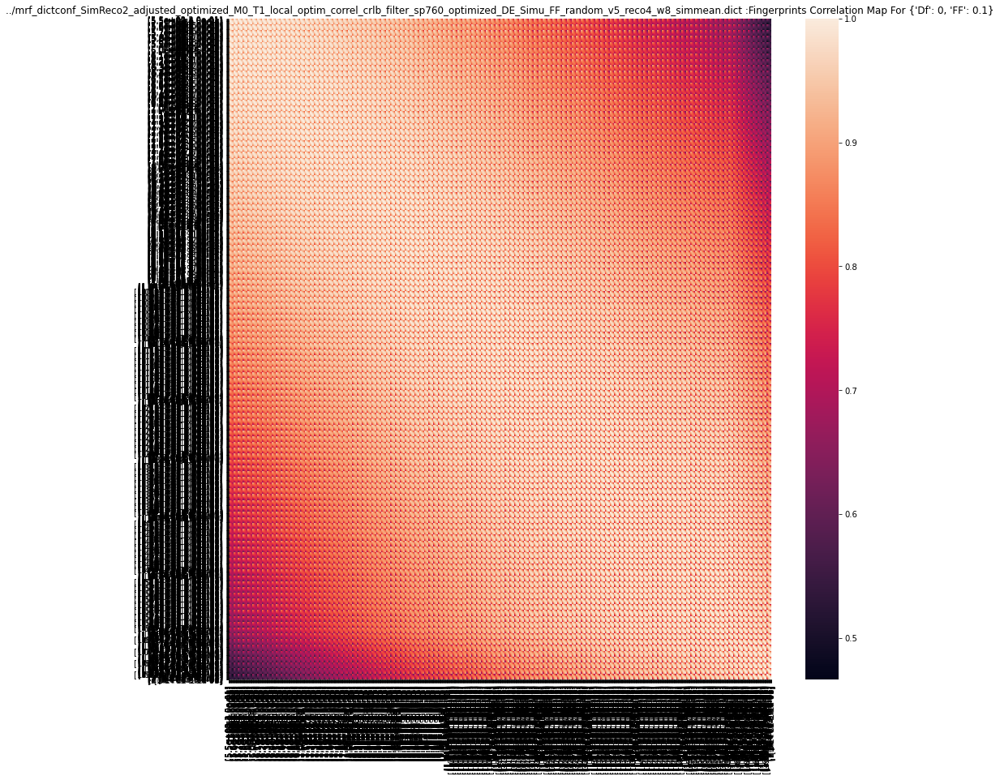

In [166]:
%matplotlib inline
dictfile_corr_mapping,axis_values=compare_dict_covariance(dictfile_value_mapping,keys,fixed_parameters_list,fixed_values=fixed_values)

In [170]:
axis_values

array([[5.5e+02, 3.0e-01],
       [5.5e+02, 3.5e-01],
       [5.5e+02, 4.0e-01],
       ...,
       [2.0e+03, 9.0e-01],
       [2.0e+03, 9.5e-01],
       [2.0e+03, 1.0e+00]])

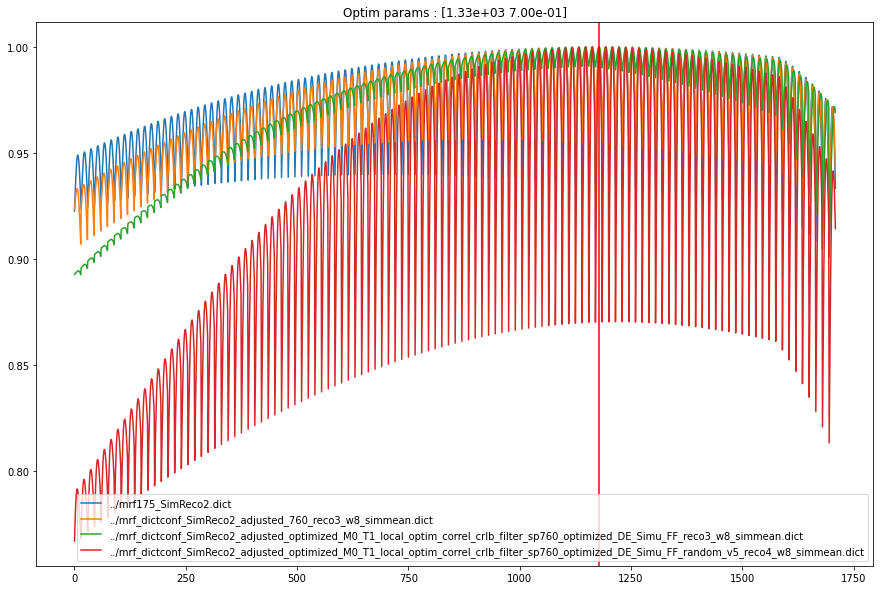

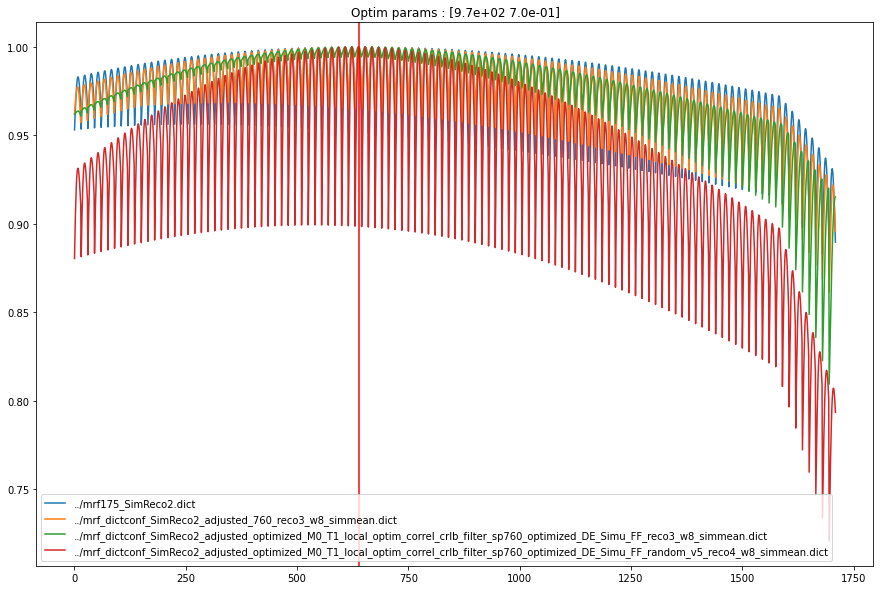

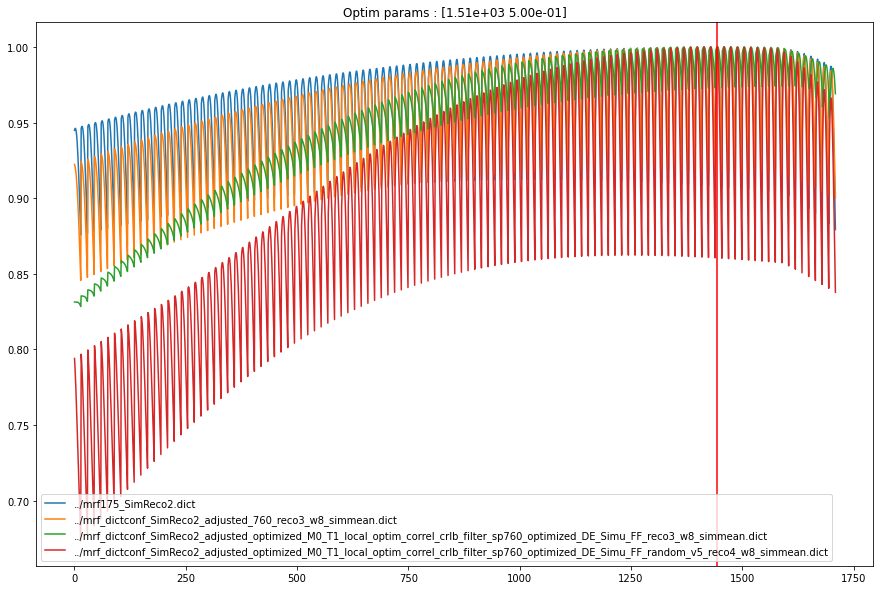

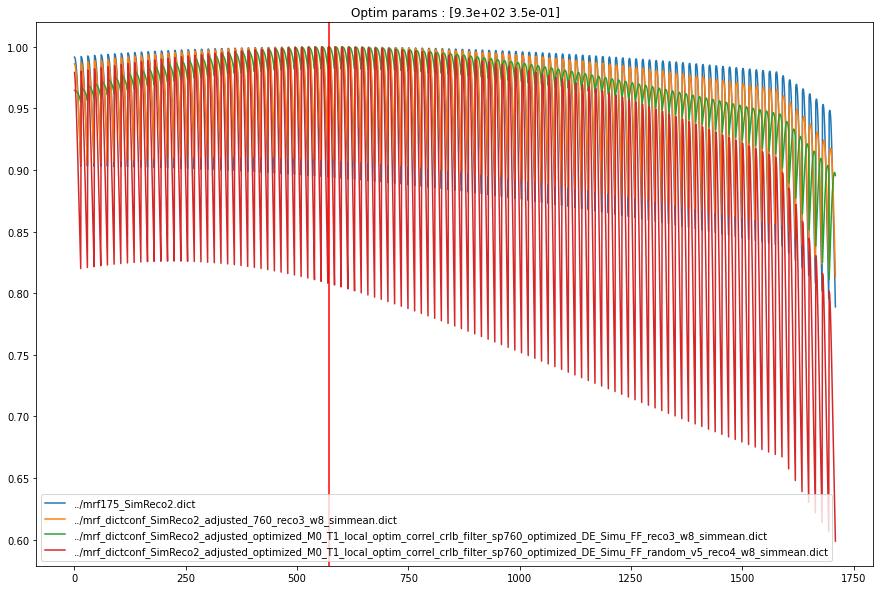

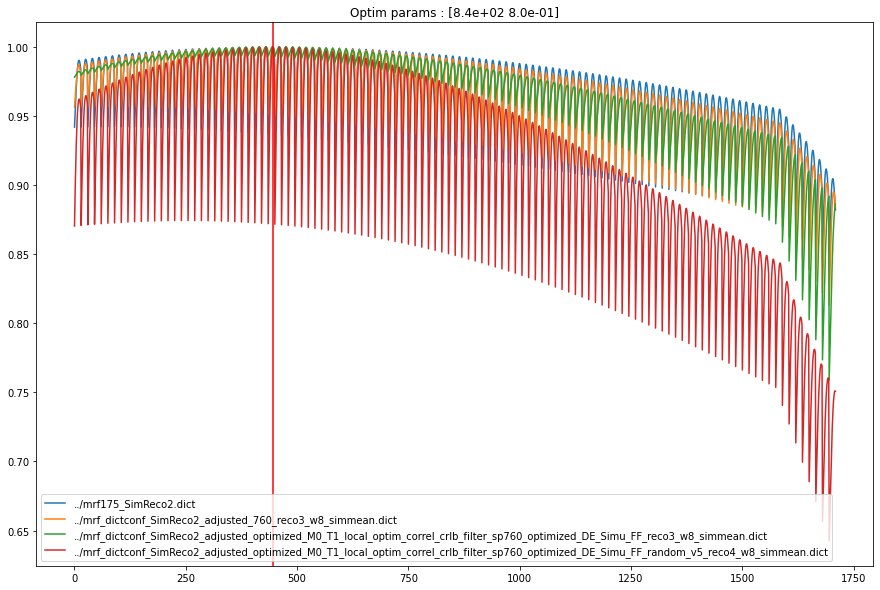

In [169]:
compare_random_signals_correlations(dictfile_corr_mapping,axis_values,num_sig=5)

In [104]:
np.argmax(Z)

32

In [117]:

N=100
max_corr=0
min_corr=np.inf

for dictfile in dictfile_value_mapping.keys():
    corr_signal=dictfile_corr_mapping[dictfile]
    corr_shape=corr_signal.shape[0]
    curr_corr=corr_signal[num_signal,:]
    max_corr=np.maximum(np.max(curr_corr),max_corr)
    min_corr=np.minimum(np.min(curr_corr),min_corr)
    
    

In [120]:
levels

array([0.58 , 0.585, 0.59 , 0.595, 0.6  , 0.605, 0.61 , 0.615, 0.62 ,
       0.625, 0.63 , 0.635, 0.64 , 0.645, 0.65 , 0.655, 0.66 , 0.665,
       0.67 , 0.675, 0.68 , 0.685, 0.69 , 0.695, 0.7  , 0.705, 0.71 ,
       0.715, 0.72 , 0.725, 0.73 , 0.735, 0.74 , 0.745, 0.75 , 0.755,
       0.76 , 0.765, 0.77 , 0.775, 0.78 , 0.785, 0.79 , 0.795, 0.8  ,
       0.805, 0.81 , 0.815, 0.82 , 0.825, 0.83 , 0.835, 0.84 , 0.845,
       0.85 , 0.855, 0.86 , 0.865, 0.87 , 0.875, 0.88 , 0.885, 0.89 ,
       0.895, 0.9  , 0.905, 0.91 , 0.915, 0.92 , 0.925, 0.93 , 0.935,
       0.94 , 0.945, 0.95 , 0.955, 0.96 , 0.965, 0.97 , 0.975, 0.98 ,
       0.985, 0.99 , 0.995, 1.   ])

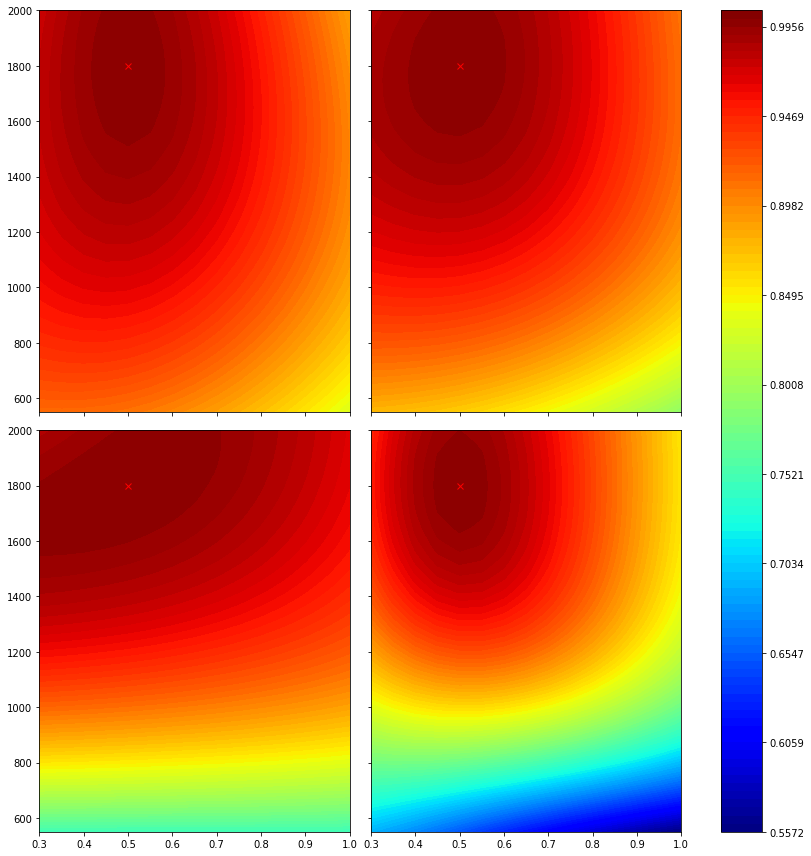

In [179]:
%matplotlib inline
fig, axn = plt.subplots(2, 2, sharex=True, sharey=True,figsize=(12,12))
#cbar_ax = fig.add_axes([.91, .3, .03, .4])
corr_shape=list(dictfile_corr_mapping.values())[0].shape[0]
num_signal=np.random.choice(corr_shape)

N=100
max_corr=0
min_corr=np.inf

for dictfile in dictfile_value_mapping.keys():
    corr_signal=dictfile_corr_mapping[dictfile]
    corr_shape=corr_signal.shape[0]
    curr_corr=corr_signal[num_signal,:]
    max_corr=np.maximum(np.max(curr_corr),max_corr)
    min_corr=np.minimum(np.min(curr_corr),min_corr)
    

levels=np.arange(min_corr,max_corr+(max_corr-min_corr)/N,(max_corr-min_corr)/N)

for i, ax in enumerate(axn.flat):
    dictfile=list(dictfile_value_mapping.keys())[i]
    corr_signal=dictfile_corr_mapping[dictfile]

    corr_shape=corr_signal.shape[0]
    
    curr_corr=corr_signal[num_signal,:]
    

    shape_0=len(np.unique(axis_values[:,0]))
    shape_1=len(np.unique(axis_values[:,1]))
    X,Y=np.meshgrid(np.unique(axis_values[:,1]),np.unique(axis_values[:,0]))
    Z=curr_corr.reshape(shape_0,shape_1)
    
    #sns.heatmap(Z, ax=ax,
    #            cbar=i == 0,
    #            vmin=0, vmax=1,xticklabels=np.unique(axis_values[:,0]), yticklabels=np.unique(axis_values[:,1]),
    #            cbar_ax=None if i else cbar_ax)
    #
    #if i==0:
    #    cf=ax.contourf(X,Y,Z,100,cmap="viridis")
    #    levels=cf.levels
    #else:
    #    cf=ax.contourf(X,Y,Z,100,levels=levels,cmap="viridis")
        
    cf=ax.contourf(X,Y,Z,N,levels=levels,cmap="jet")
    
    max_coord=np.unravel_index(np.argmax(Z),(shape_0,shape_1))
    ax.plot(X[max_coord[0],max_coord[1]],Y[max_coord[0],max_coord[1]],marker="x",c="red")
    
    #ax.plot()
    
plt.tight_layout()
plt.colorbar(cf, ax=axn)
    
#fig.tight_layout(rect=[0, 0, .9, 1])

In [174]:
X.shape

(15, 114)

# Play with first Plateau

In [115]:
np.min(corr_signal)

0.7390064352956132

In [83]:
dictfile_list=["../mrf175_SimReco2_light.dict","../mrf175_SimReco2_light_plateau200.dict","../mrf175_SimReco2_light_plateau400.dict","../mrf175_SimReco2_light_plateau600.dict"] 
dictfile_value_mapping,keys=fill_dictfile_value_mapping(dictfile_list)

## Df FF 

In [84]:
fixed_parameters_list=["wT1","B1"]

/Users/constantinslioussarenko/opt/anaconda3/envs/MRF/lib/python3.8/site-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


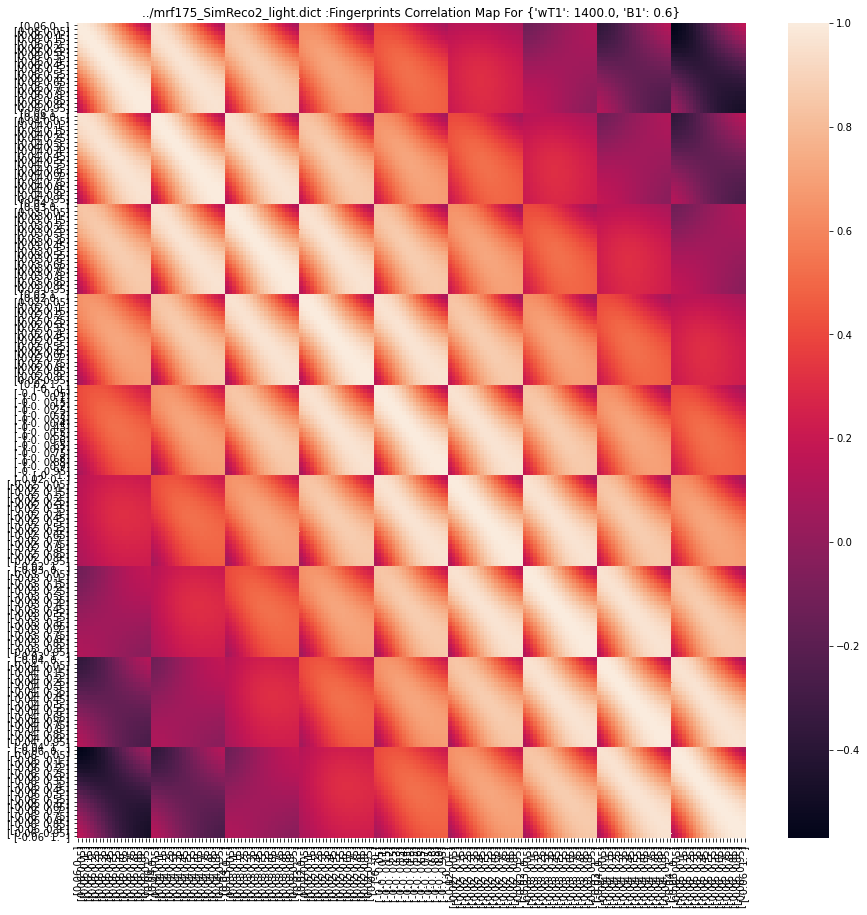

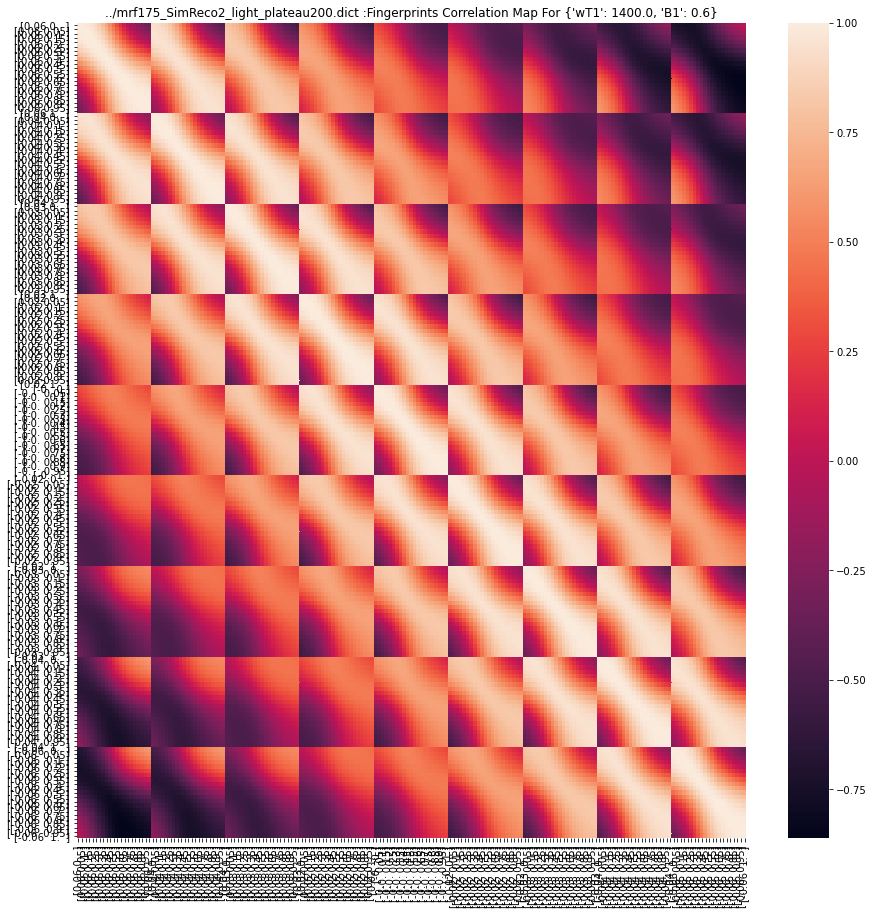

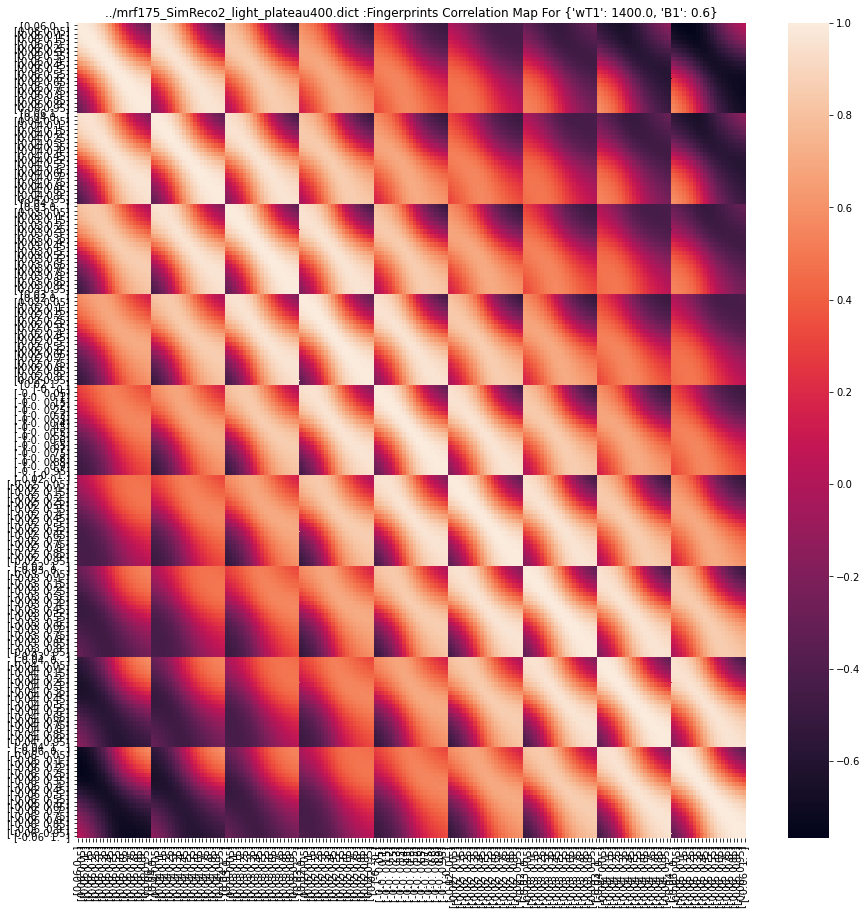

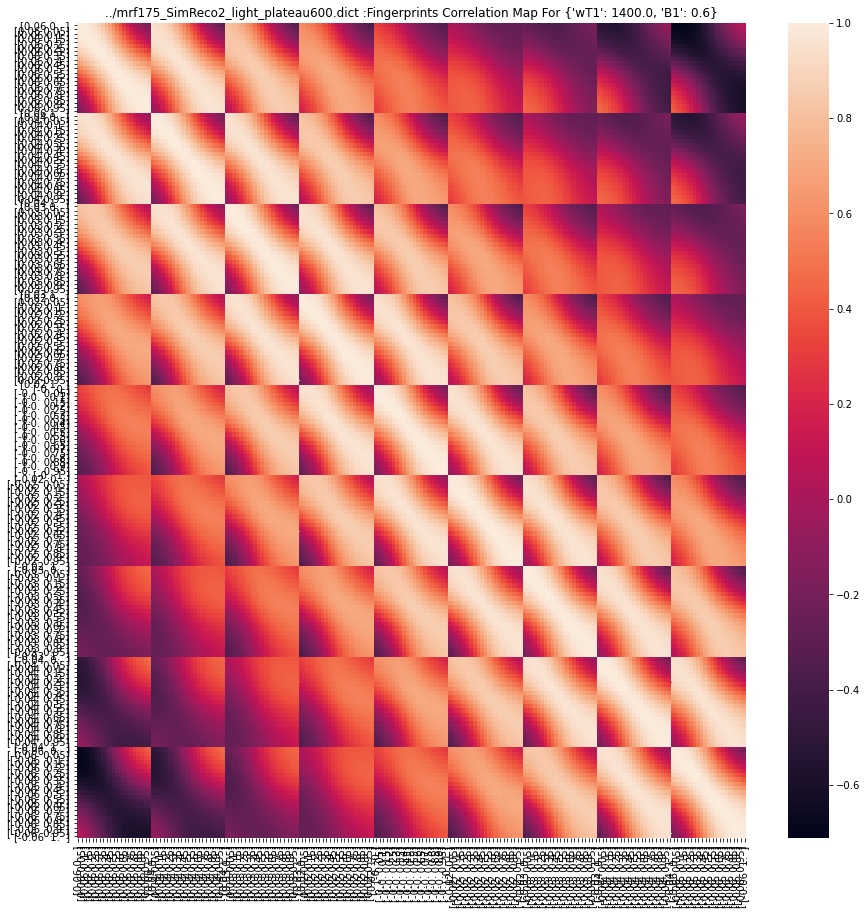

In [85]:
dictfile_corr_mapping,axis_values=compare_dict_covariance(dictfile_value_mapping,keys,fixed_parameters_list)

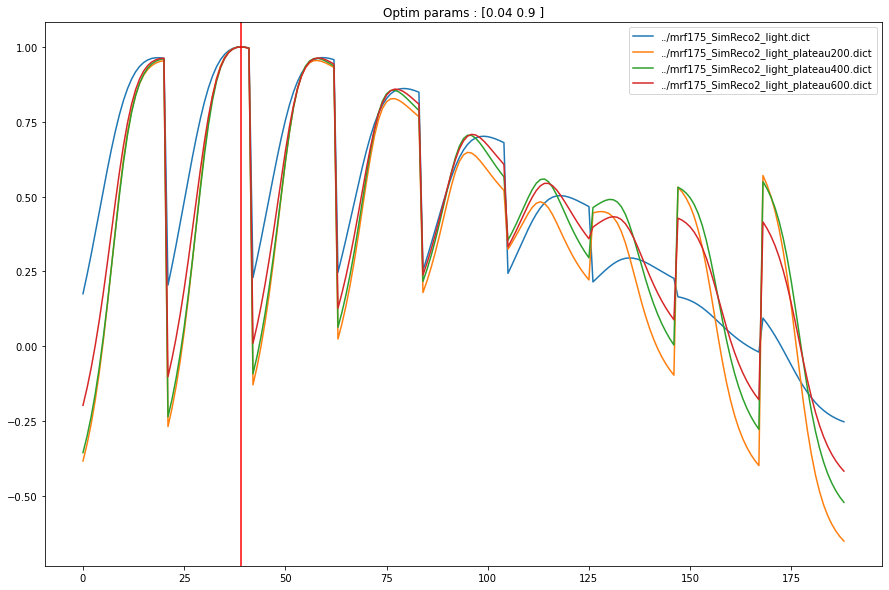

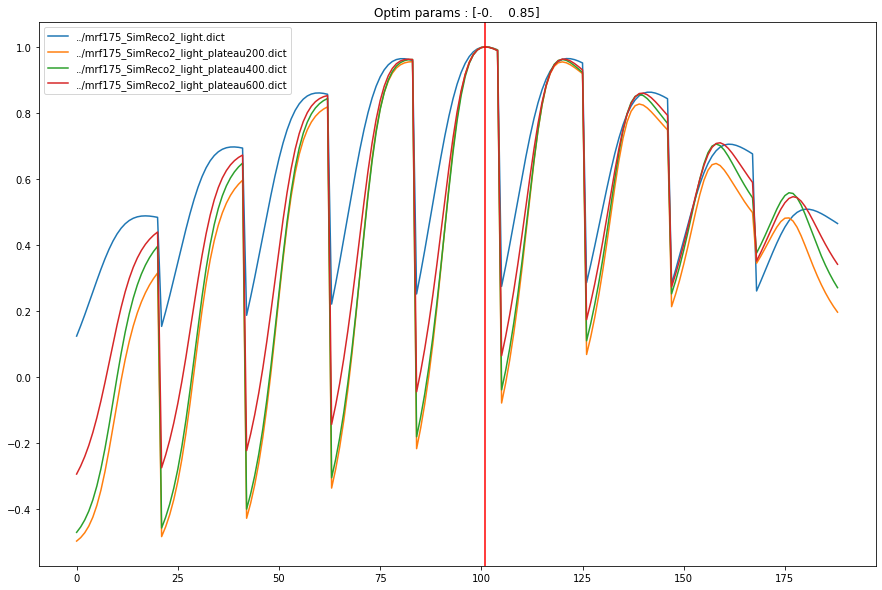

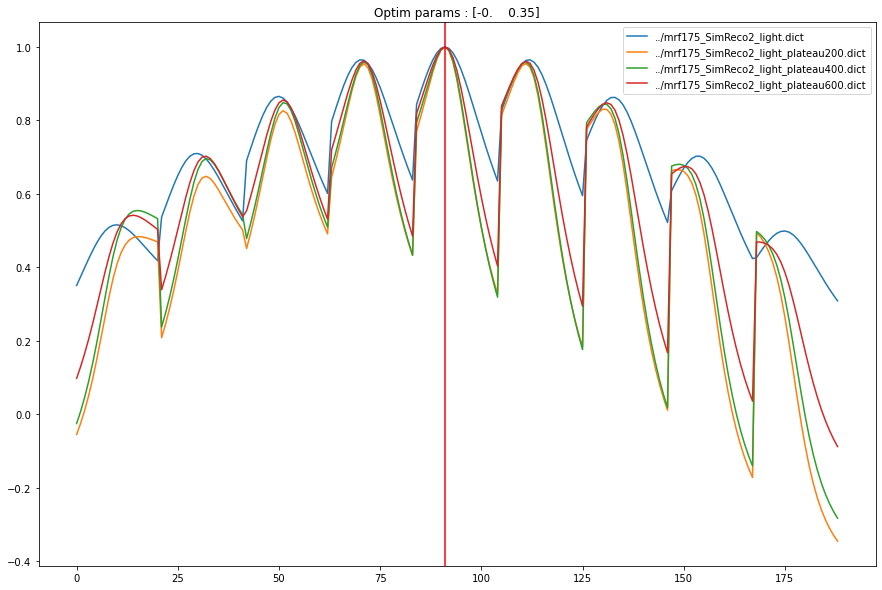

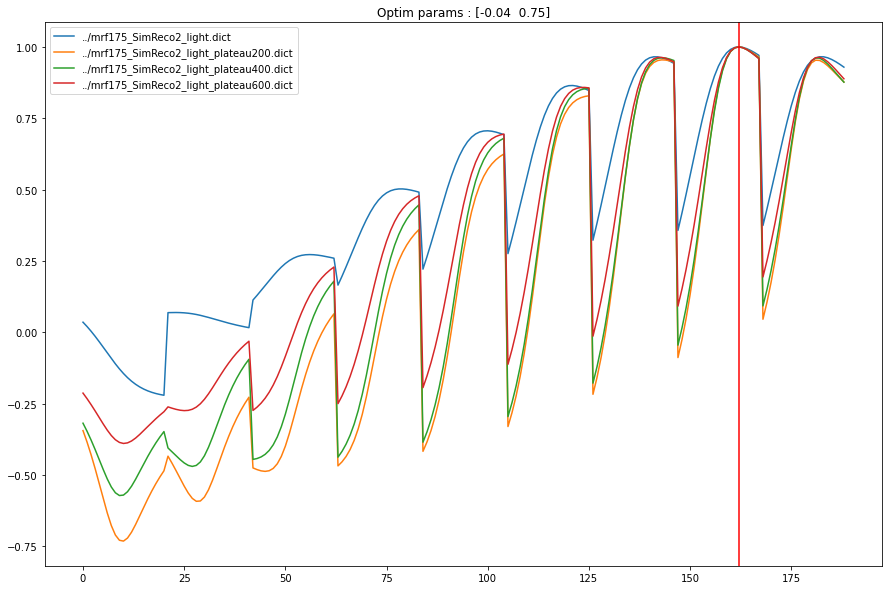

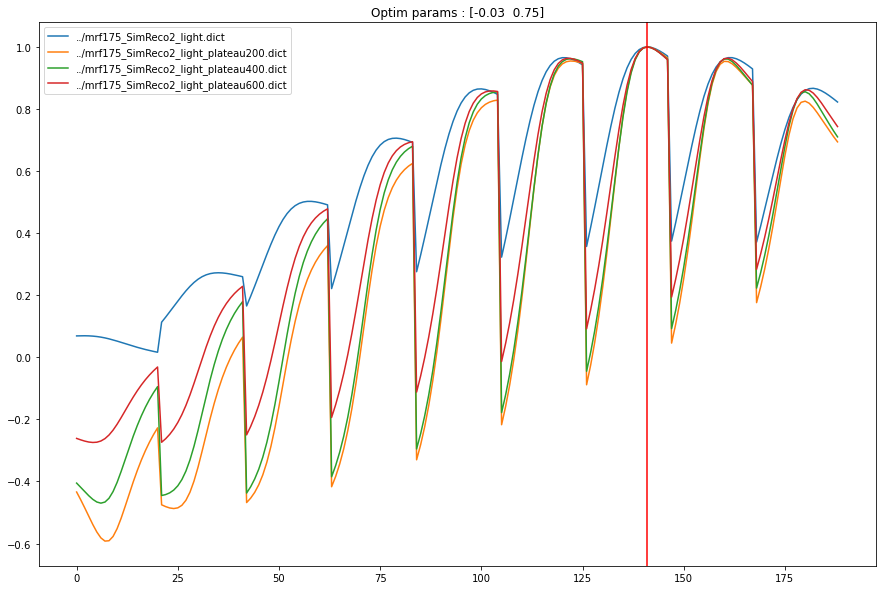

In [86]:
compare_random_signals_correlations(dictfile_corr_mapping,axis_values,num_sig=5)

## T1 

In [87]:
fixed_parameters_list=["Df","FF","B1"]

/Users/constantinslioussarenko/opt/anaconda3/envs/MRF/lib/python3.8/site-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


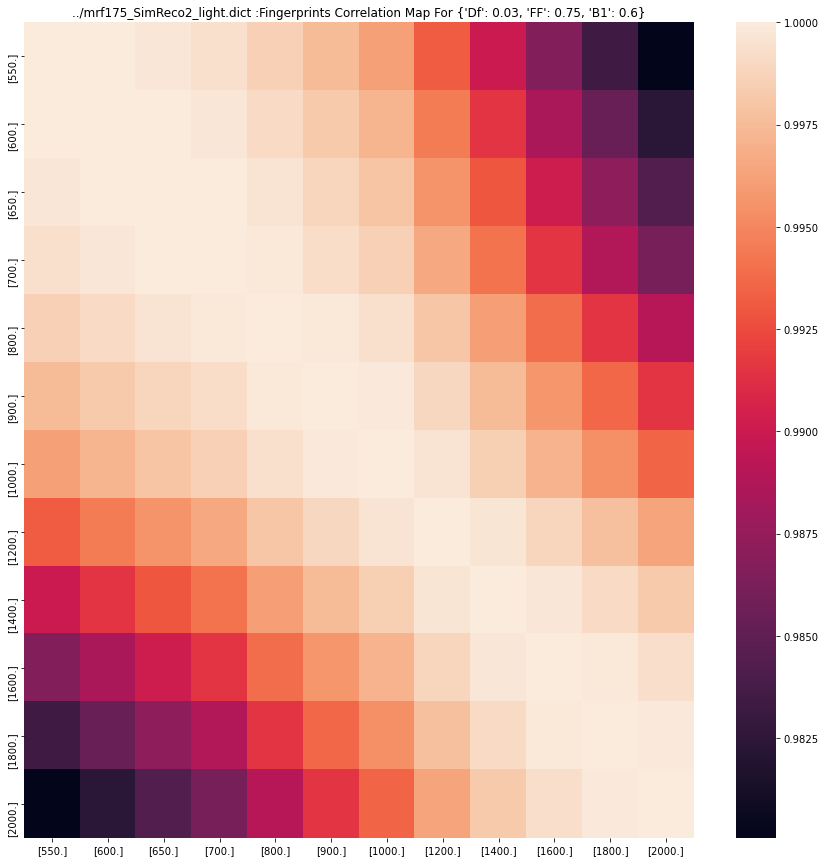

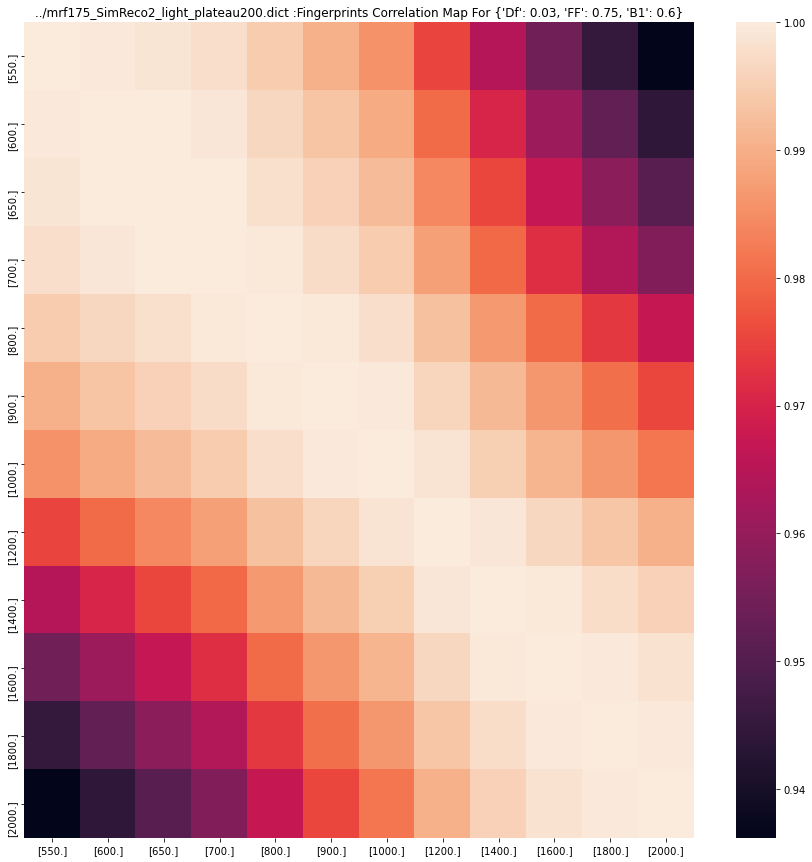

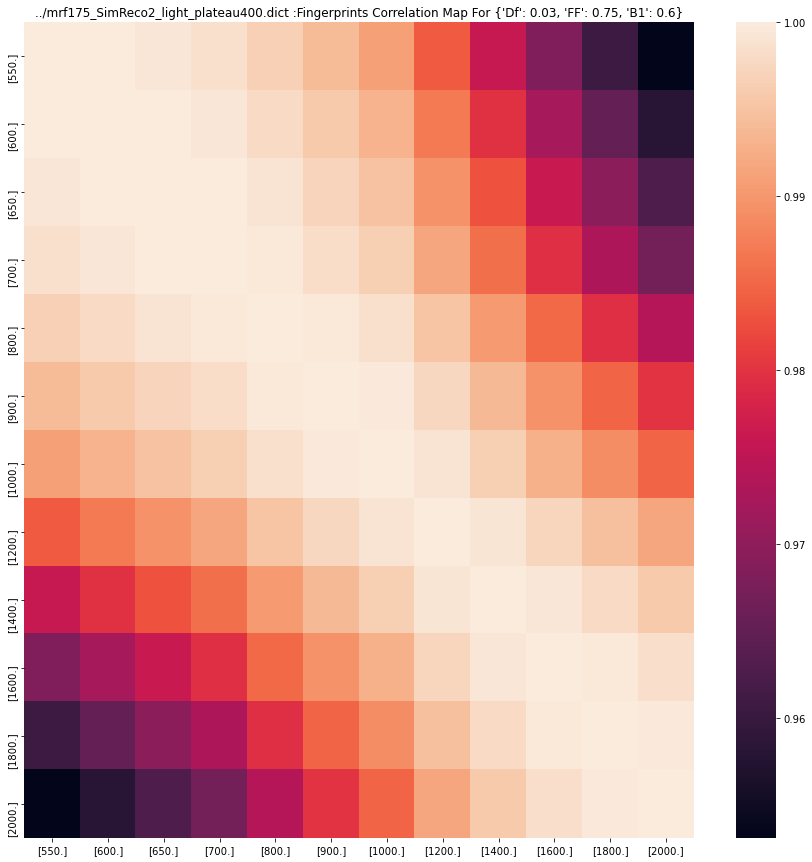

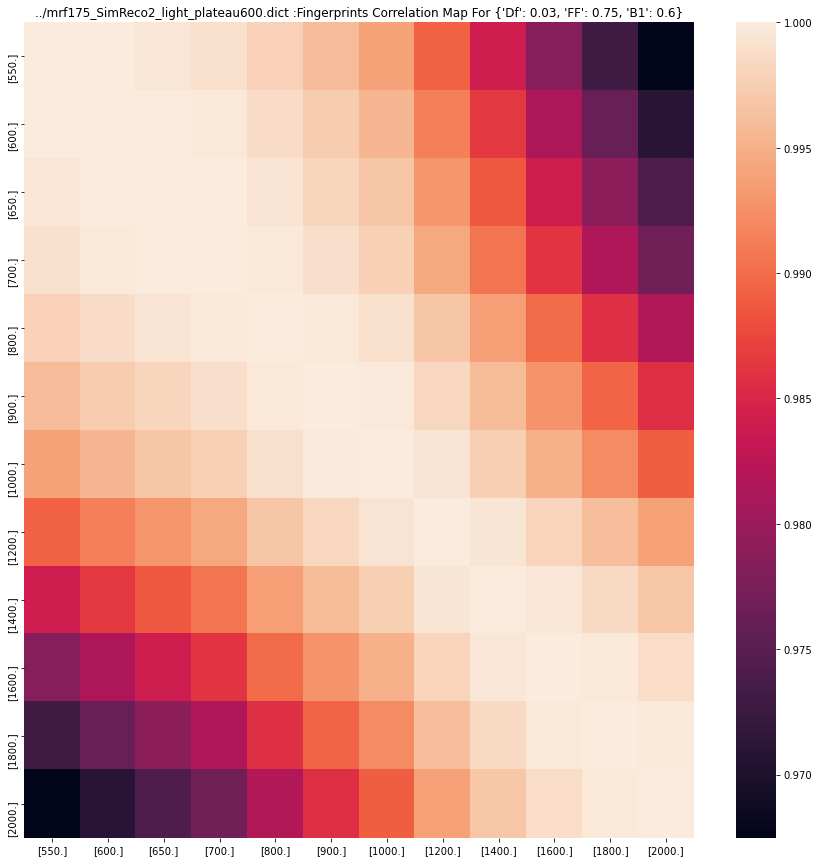

In [88]:
dictfile_corr_mapping,axis_values=compare_dict_covariance(dictfile_value_mapping,keys,fixed_parameters_list)

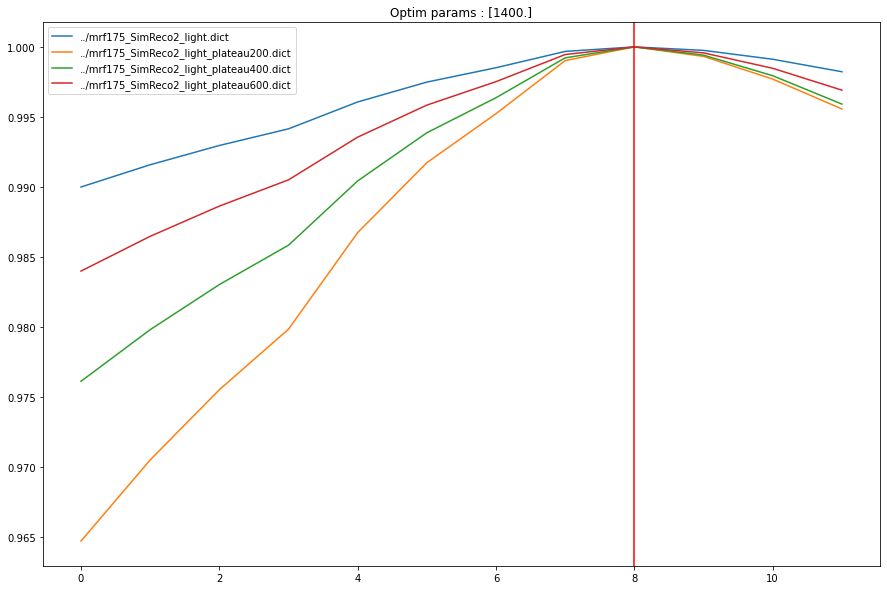

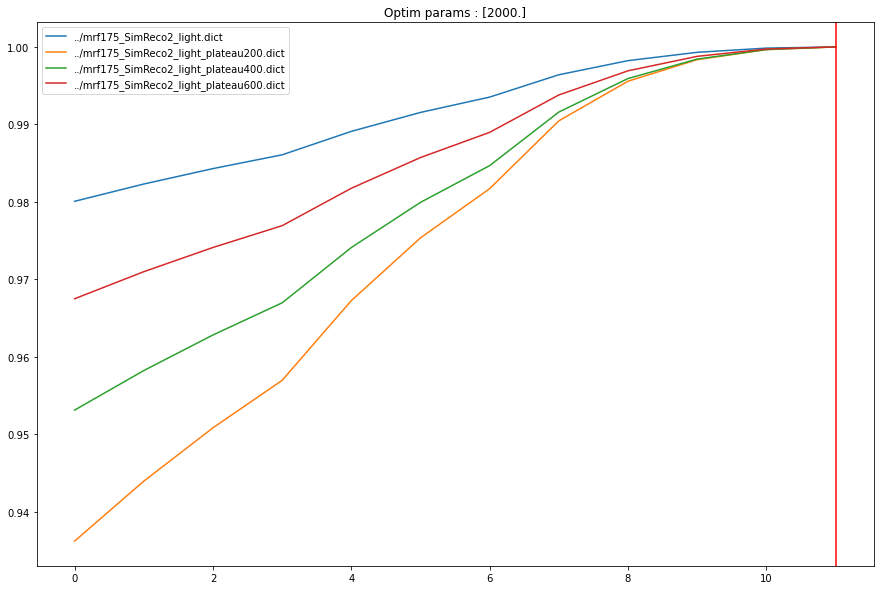

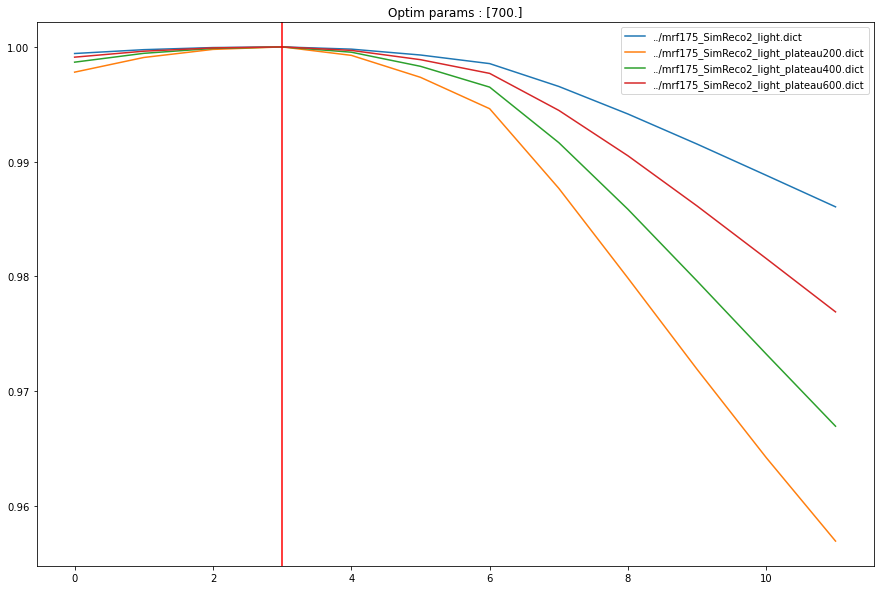

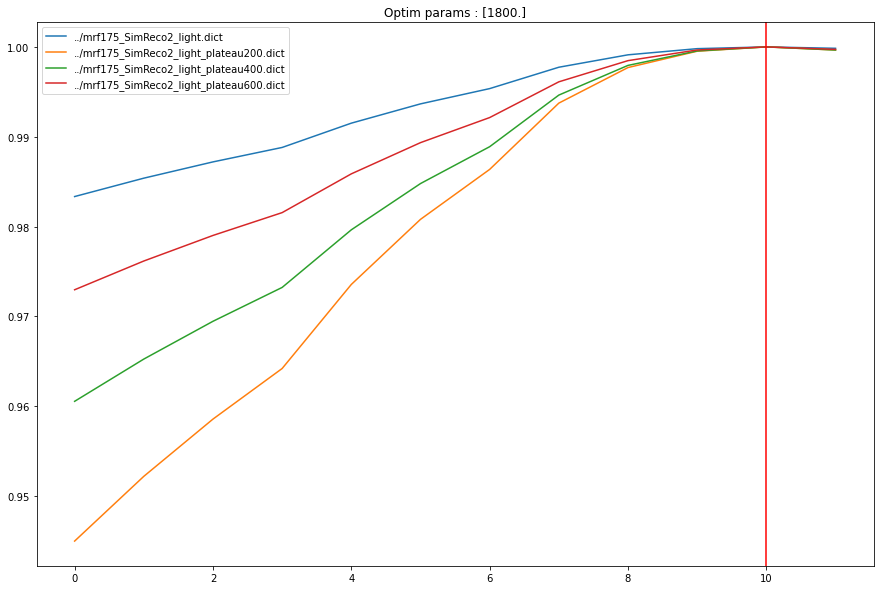

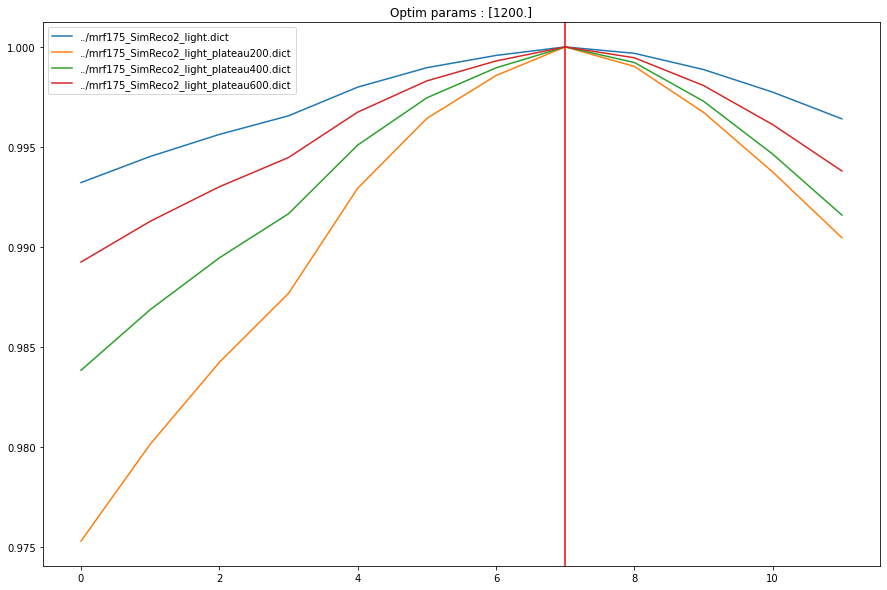

In [94]:
compare_random_signals_correlations(dictfile_corr_mapping,axis_values,num_sig=5)

In [90]:
2.39/1000*800*0.06*1000

114.72

In [92]:
2.39/1000*60*1000

143.4

In [93]:
60/(42.56*1000)

0.0014097744360902255

In [50]:
print("Optim FF {} - Optim Df {}".format(ff_optim,df_optim))
print("###########################")
correl_max_by_df = []
for df_cur in df_all:
    index_df = keys_b1_t1[:,-2:][:,0]==df_cur
    keys_df = keys_b1_t1[:,-2:][index_df]
    corr_signal_cur=corr_signal[num_signal,index_df]
    ind_max=np.argmax(corr_signal_cur)
    print("Optim FF for Df {} is {} --- CORREL {}".format(df_cur,np.round(keys_df[ind_max,1],2),np.round(corr_signal_cur[ind_max],2)))
    correl_max_by_df.append(corr_signal_cur[ind_max])
    

Optim FF 0.7 - Optim Df 0.06
###########################
Optim FF for Df -0.06 is 0.0 --- CORREL -0.1
Optim FF for Df -0.045 is 0.0 --- CORREL 0.05
Optim FF for Df -0.03 is 0.0 --- CORREL 0.19
Optim FF for Df -0.015 is 0.35 --- CORREL 0.35
Optim FF for Df -0.0 is 0.5 --- CORREL 0.54
Optim FF for Df 0.015 is 0.55 --- CORREL 0.73
Optim FF for Df 0.03 is 0.6 --- CORREL 0.87
Optim FF for Df 0.045 is 0.65 --- CORREL 0.97
Optim FF for Df 0.06 is 0.7 --- CORREL 1.0


In [51]:
print("CONSTANTT_TE_mid")
print("Optim FF {} - Optim Df {}".format(ff_optim,df_optim))
print("###########################")
correl_max_by_df_constantTE_mid = []
for df_cur in df_all:
    index_df = keys_b1_t1[:,-2:][:,0]==df_cur
    keys_df = keys_b1_t1[:,-2:][index_df]
    corr_signal_cur=corr_signal_constantTE_mid[num_signal,index_df]
    ind_max=np.argmax(corr_signal_cur)
    print("Optim FF for Df {} is {} --- CORREL {}".format(df_cur,np.round(keys_df[ind_max,1],2),np.round(corr_signal_cur[ind_max],2)))
    correl_max_by_df_constantTE_mid.append(corr_signal_cur[ind_max])
    

CONSTANTT_TE_mid
Optim FF 0.7 - Optim Df 0.06
###########################
Optim FF for Df -0.06 is 0.0 --- CORREL 0.5
Optim FF for Df -0.045 is 0.0 --- CORREL 0.73
Optim FF for Df -0.03 is 0.0 --- CORREL 0.88
Optim FF for Df -0.015 is 0.0 --- CORREL 0.94
Optim FF for Df -0.0 is 0.3 --- CORREL 0.95
Optim FF for Df 0.015 is 0.45 --- CORREL 0.96
Optim FF for Df 0.03 is 0.55 --- CORREL 0.98
Optim FF for Df 0.045 is 0.6 --- CORREL 0.99
Optim FF for Df 0.06 is 0.7 --- CORREL 1.0


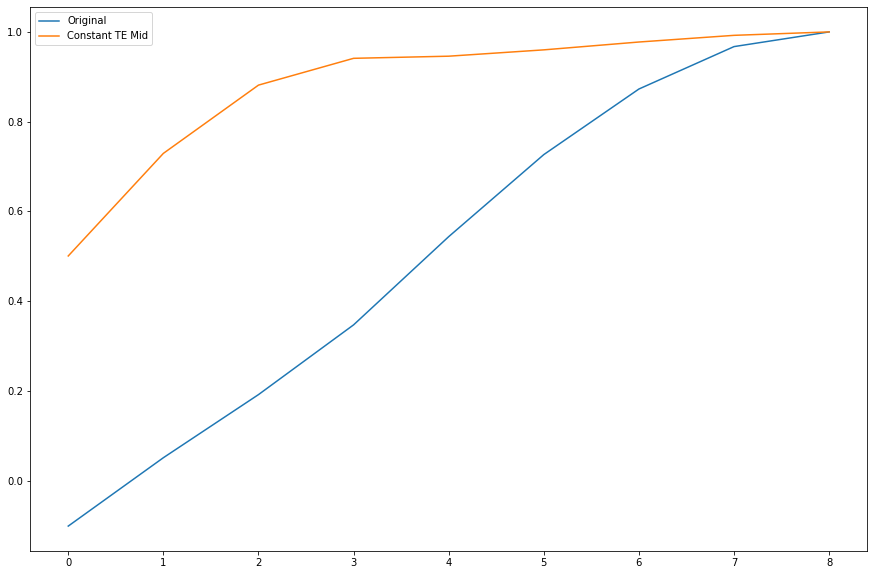

In [53]:
plt.figure(figsize=(15,10))
plt.plot(correl_max_by_df,label="Original")
plt.plot(correl_max_by_df_constantTE_mid,label="Constant TE Mid")
plt.legend()


100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 20.61it/s]


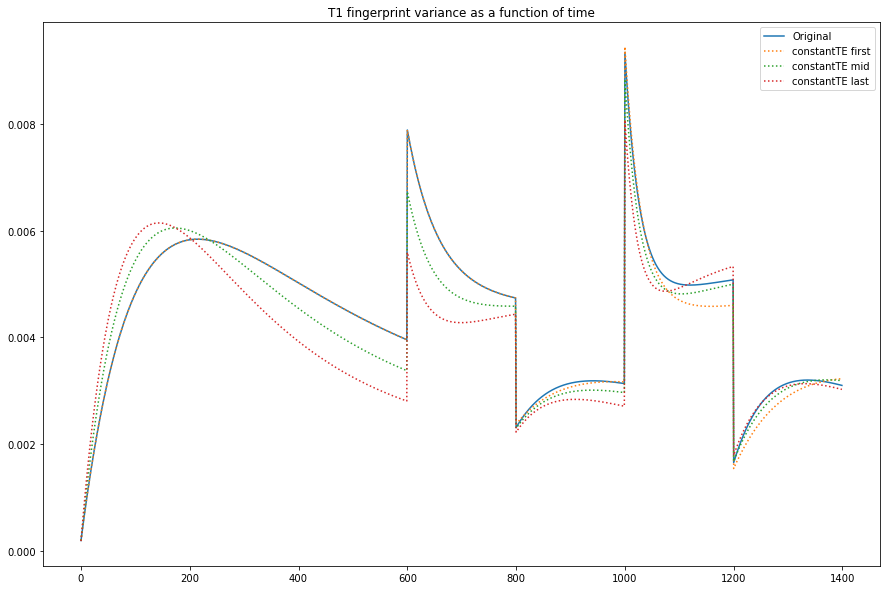

In [81]:
mean_variance_t1 = calculate_variance(2,3,4,keys_unique,values_unique)
mean_variance_t1_constantTE_first = calculate_variance(2,3,4,keys_unique,values_unique_constantTE_first)
mean_variance_t1_constantTE_mid = calculate_variance(2,3,4,keys_unique,values_unique_constantTE_mid)
mean_variance_t1_constantTE_last = calculate_variance(2,3,4,keys_unique,values_unique_constantTE_last)

plt.figure(figsize=(15,10))
plt.plot(mean_variance_t1,label="Original")
plt.plot(mean_variance_t1_constantTE_first,label="constantTE first",linestyle="dotted")
plt.plot(mean_variance_t1_constantTE_mid,label="constantTE mid",linestyle="dotted")
plt.plot(mean_variance_t1_constantTE_last,label="constantTE last",linestyle="dotted")
plt.title("T1 fingerprint variance as a function of time")
plt.legend()

### FF

100%|█████████████████████████████████████████████| 8/8 [00:00<00:00, 30.75it/s]


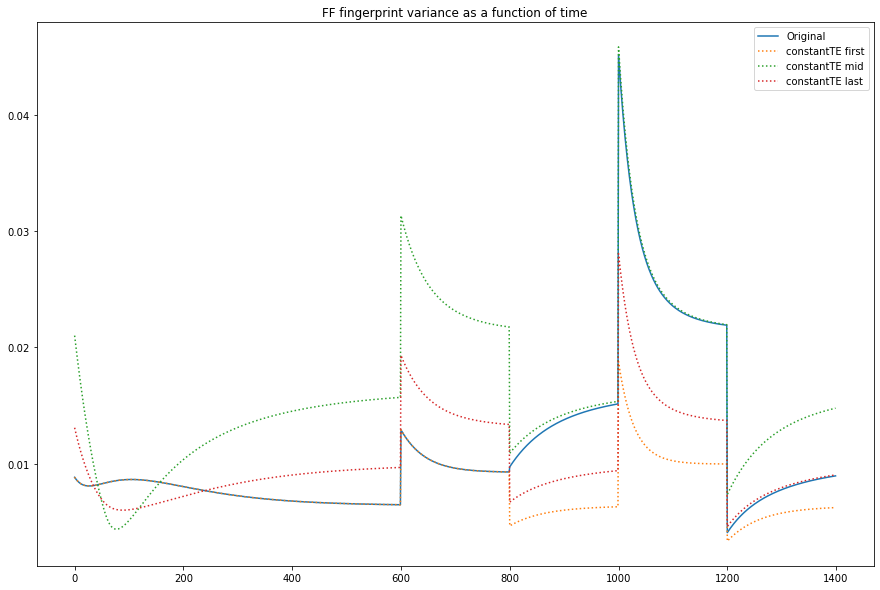

In [82]:
mean_variance_ff = calculate_variance(2,3,0,keys_unique,values_unique)
mean_variance_ff_constantTE_first = calculate_variance(2,3,0,keys_unique,values_unique_constantTE_first)
mean_variance_ff_constantTE_mid = calculate_variance(2,3,0,keys_unique,values_unique_constantTE_mid)
mean_variance_ff_constantTE_last = calculate_variance(2,3,0,keys_unique,values_unique_constantTE_last)


plt.figure(figsize=(15,10))
plt.plot(mean_variance_ff,label="Original")
plt.plot(mean_variance_ff_constantTE_first,label="constantTE first",linestyle="dotted")
plt.plot(mean_variance_ff_constantTE_mid,label="constantTE mid",linestyle="dotted")
plt.plot(mean_variance_ff_constantTE_last,label="constantTE last",linestyle="dotted")
plt.title("FF fingerprint variance as a function of time")
plt.legend()

## B1

100%|███████████████████████████████████████████| 12/12 [00:00<00:00, 28.95it/s]


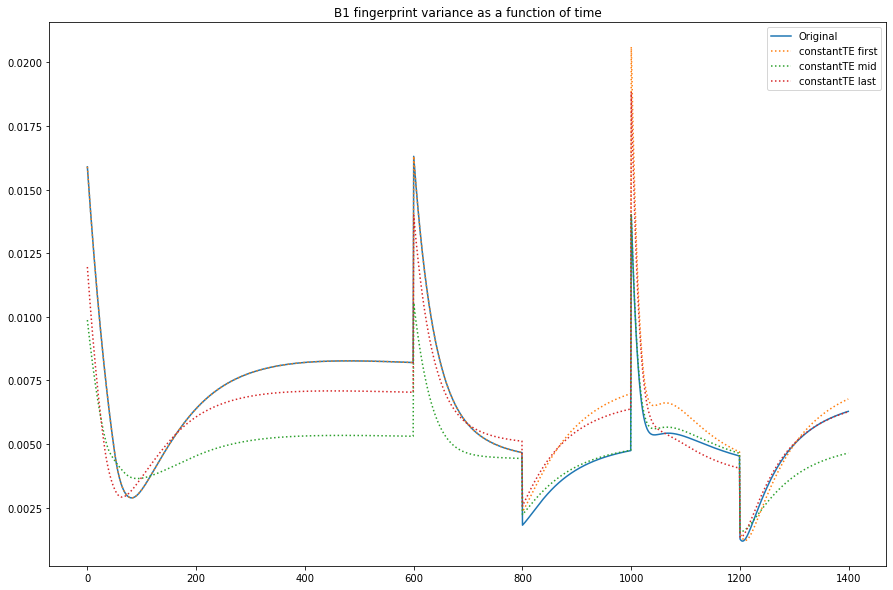

In [83]:
mean_variance_b1 = calculate_variance(0,3,4,keys_unique,values_unique)
mean_variance_b1_constantTE_first = calculate_variance(0,3,4,keys_unique,values_unique_constantTE_first)
mean_variance_b1_constantTE_mid = calculate_variance(0,3,4,keys_unique,values_unique_constantTE_mid)
mean_variance_b1_constantTE_last = calculate_variance(0,3,4,keys_unique,values_unique_constantTE_last)


plt.figure(figsize=(15,10))
plt.plot(mean_variance_b1,label="Original")
plt.plot(mean_variance_b1_constantTE_first,label="constantTE first",linestyle="dotted")
plt.plot(mean_variance_b1_constantTE_mid,label="constantTE mid",linestyle="dotted")
plt.plot(mean_variance_b1_constantTE_last,label="constantTE last",linestyle="dotted")
plt.title("B1 fingerprint variance as a function of time")
plt.legend()

## DF

100%|███████████████████████████████████████████| 12/12 [00:00<00:00, 30.21it/s]


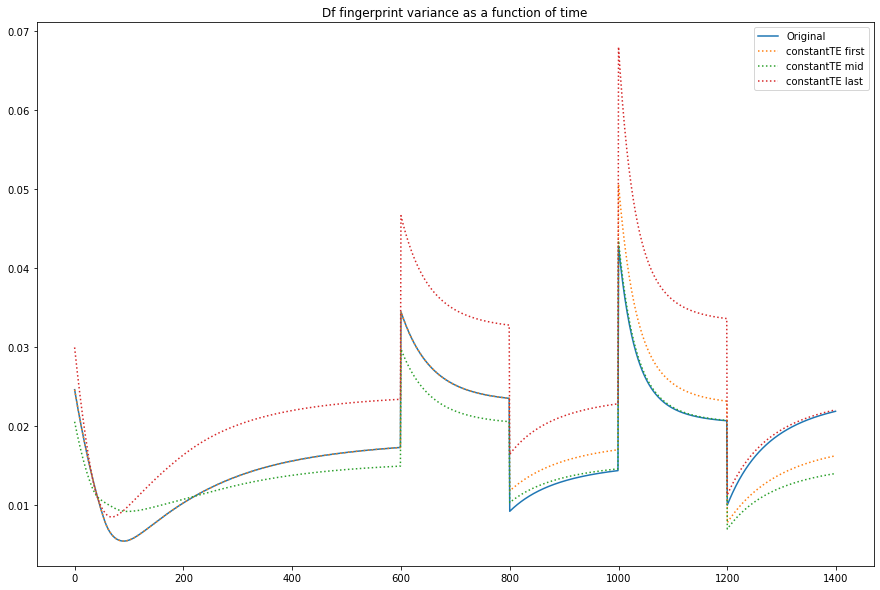

In [84]:
mean_variance_df = calculate_variance(0,2,4,keys_unique,values_unique)
mean_variance_df_constantTE_first = calculate_variance(0,2,4,keys_unique,values_unique_constantTE_first)
mean_variance_df_constantTE_mid = calculate_variance(0,2,4,keys_unique,values_unique_constantTE_mid)
mean_variance_df_constantTE_last = calculate_variance(0,2,4,keys_unique,values_unique_constantTE_last)


plt.figure(figsize=(15,10))
plt.plot(mean_variance_df,label="Original")
plt.plot(mean_variance_df_constantTE_first,label="constantTE first",linestyle="dotted")
plt.plot(mean_variance_df_constantTE_mid,label="constantTE mid",linestyle="dotted")
plt.plot(mean_variance_df_constantTE_last,label="constantTE last",linestyle="dotted")
plt.title("Df fingerprint variance as a function of time")
plt.legend()

In [154]:
t1_all

array([ 550.,  600.,  650.,  700.,  800.,  900., 1000., 1200., 1400.,
       1600., 1800., 2000.])

In [155]:
t1 = np.random.choice(t1_all)
ff = np.random.choice(ff_all)
b1 = np.random.choice(b1_all)

In [ ]:
index_keys = np.argwhere((keys_unique[:,0]==t1)&(keys_unique[:,2]==b1)&(keys_unique[:,4]==ff)).flatten()


In [176]:
df_values = keys_unique[index_keys,3]
index_sorted=np.argsort(df_values)
index_keys=index_keys[index_sorted]

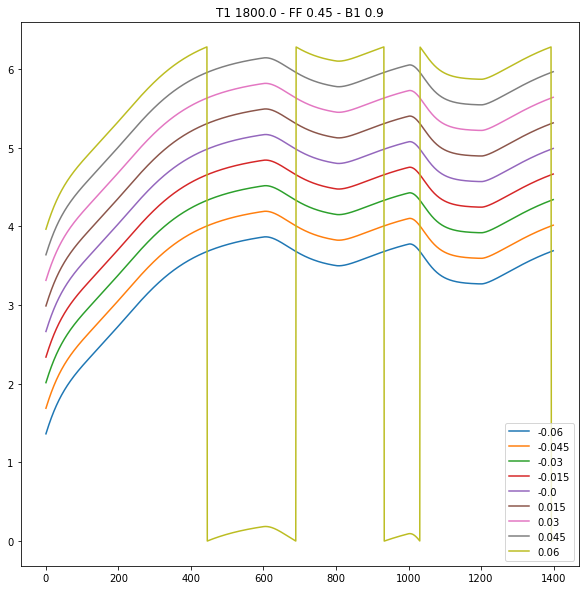

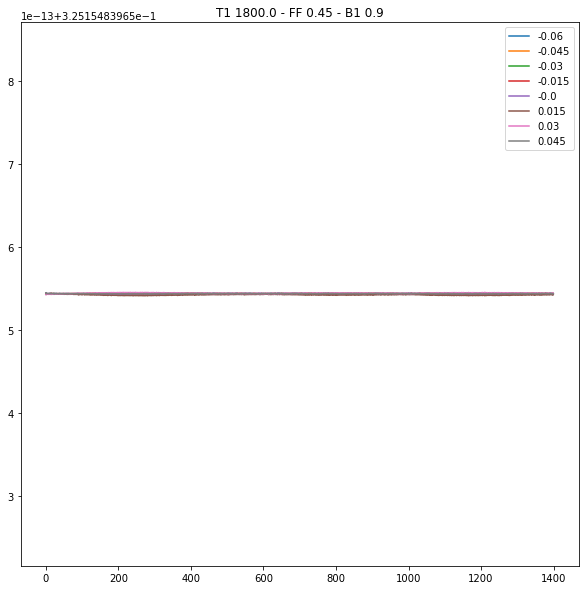

In [180]:
signals_df = values_unique_constantTE_mid[index_keys]

metric=np.angle
plt.figure(figsize=(10,10))
plot = plt.plot(np.mod(metric(signals_df.T),2*np.pi))
plt.title("T1 {} - FF {} - B1 {}".format(t1,ff,b1))
plt.legend(plot, keys_unique[index_keys,3])
metric=np.angle
plt.figure(figsize=(10,10))
plot = plt.plot(np.mod(np.diff(metric(signals_df.T)),2*np.pi))
plt.title("T1 {} - FF {} - B1 {}".format(t1,ff,b1))
plt.legend(plot, keys_unique[index_keys,3])

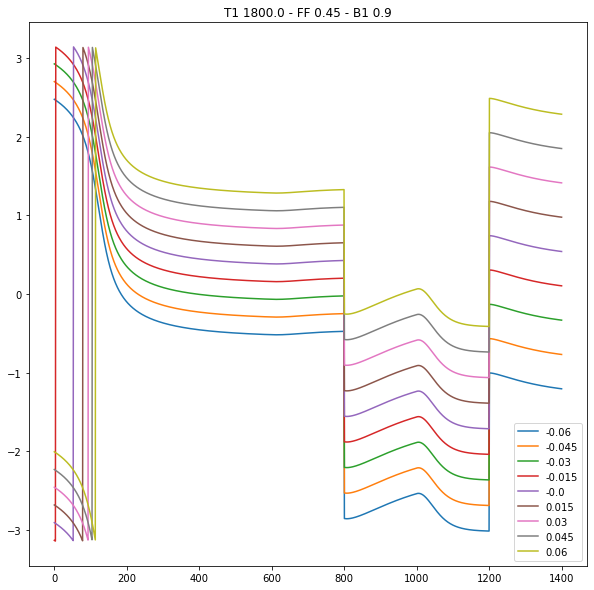

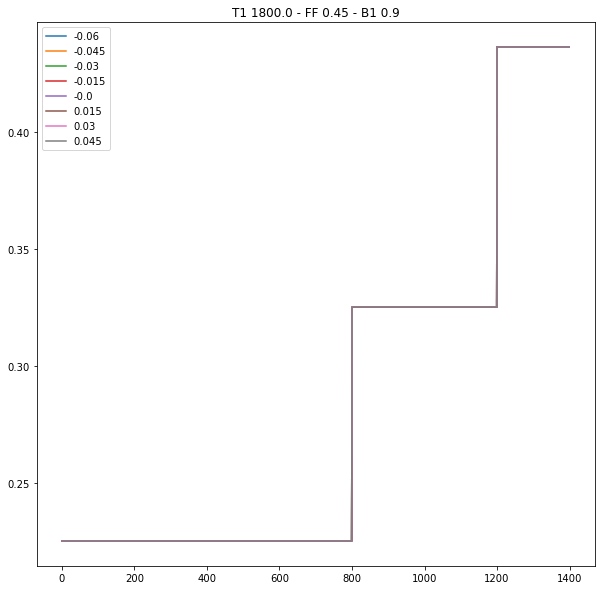

In [181]:
signals_df = values_unique[index_keys]

metric=np.angle
plt.figure(figsize=(10,10))
plot = plt.plot(metric(signals_df.T))
plt.title("T1 {} - FF {} - B1 {}".format(t1,ff,b1))
plt.legend(plot, keys_unique[index_keys,3])
metric=np.angle
plt.figure(figsize=(10,10))
plot = plt.plot(np.mod(np.diff(metric(signals_df.T)),np.pi))
plt.title("T1 {} - FF {} - B1 {}".format(t1,ff,b1))
plt.legend(plot, keys_unique[index_keys,3])